# Setup

In [3]:
!pip -q install plotly dash

In [4]:
from IPython.display import display
from modules.quicklook.src.analyze_time_series import AnalyzeTimeSeries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skew, kurtosis, mode
import time
from datetime import datetime
%matplotlib inline
import sqlite3

import plotly.express as px
import plotly.graph_objects as go
from dash import Dash, dcc, html, Input, Output, callback_context, State, no_update, ctx
import plotly.subplots as sp
from dash.dependencies import Input, Output, State
import socket

In [5]:
# files stored locally at /data/user/jspencermorris/testdata
db_path = '/testdata/kpf_ts_oct2024_v3.db' # name of database file

# import the test timeseries database
myTS = AnalyzeTimeSeries(db_path=db_path)

INFO: Starting AnalyzeTimeSeries
INFO: Jupyter Notebook environment detected.
INFO: Path of database file: /testdata/kpf_ts_oct2024_v3.db
INFO: Base data directory: /data/L0
INFO: Primary table 'kpfdb' created/updated successfully.
INFO: Metadata table 'kpfdb_metadata' created/updated successfully.
INFO: Summary: 33057 obs x 1214 cols over 57 days in 20240901-20241027; updated 2025-02-27 03:47:04


# Define Helper Functions

### Miscellaneous

In [6]:
# define a function to return a free port on the system for running the Dash app
def find_free_port():
    s = socket.socket(socket.AF_INET, socket.SOCK_STREAM)
    s.bind(('', 0))  # bind to a free port provided by the host.
    port = s.getsockname()[1]  # return the port number assigned.
    s.close()
    return port

### Data acquisition

In [7]:
# define a function to return the column names from the timeseries database
def get_column_names(db_path, table_name='kpfdb', show_schema='no'):
    conn = sqlite3.connect(db_path)
    cursor = conn.cursor()
    cursor.execute(f"PRAGMA table_info('{table_name}');")
    columns_info = cursor.fetchall()
    
    col_names = [col[1] for col in columns_info] # extract column names from the column information
    if show_schema.lower() == 'yes':
        print(f"Schema of {table_name}:")
        for i, col in enumerate(columns_info):
            print(f"{i}: {col[1]}")
        print("\n")  # Print a newline for better separation
    
    conn.close()
    
    return col_names

In [8]:
# define a function to run a query and return the results as a dataframe
def jsm_kpf_query(jsm_query):
    conn = sqlite3.connect(myTS.db_path)
    cursor = conn.cursor()
    query = jsm_query
    results_df = pd.read_sql_query(query, conn)
    conn.close()
    
    return results_df 

In [9]:
# define a function to perform filtering based on qc flags
def filter_qc(df, mode=None):
    if mode == None:
        return df
    elif mode == 'basic_relaxed':
        return df[
            (df['NOTJUNK'] != 0) & 
            (df['GOODREAD'] != 0) & # currently, all values are None
            (df['LFCSAT'] != 0) &
            (df['LFC2DFOK'] != 0)
        ]
    elif mode == 'basic_strict':
        return df[
            (df['NOTJUNK'] == 1) & 
            (df['GOODREAD'] == 1) &
            (df['LFCSAT'] == 1) &
            (df['LFC2DFOK'] == 1)
        ]
    elif mode == 'all_relaxed':
        return df[
            (df['NOTJUNK'] != 0) & 
            (df['GOODREAD'] != 0) & 
            (df['LFCSAT'] != 0) &
            (df['EMSAT'] != 0) & 
            (df['EMNEG'] != 0) & 
            (df['LOWBIAS'] != 0) & 
            (df['LOWDARK'] != 0) & 
            (df['LFC2DFOK'] != 0) & 
            (df['OLDBIAS'] != 0) & 
            (df['OLDDARK'] != 0) & 
            (df['OLDFLAT'] != 0) &
            #(df['FFFB'] != 'No') & # nearly all records are "No"
            #(df['EXPMETER'] != 'NO') & # nearly all records are "NO"
            (df['GREEN'] != 'NO')
        ]
    elif mode == 'all_strict':
        return df[
            (df['NOTJUNK'] == 1) & 
            (df['GOODREAD'] == 1) & 
            (df['LFCSAT'] == 1) & 
            (df['EMSAT'] == 1) & 
            (df['EMNEG'] == 1) & 
            (df['LOWBIAS'] == 1) & 
            (df['LOWDARK'] == 1) & 
            (df['LFC2DFOK'] == 1) & 
            (df['OLDBIAS'] == 1) & 
            (df['OLDDARK'] == 1) & 
            (df['OLDFLAT'] == 1) &
            #(df['FFFB'] == 'Yes') & # nearly all records are "No"
            #(df['EXPMETER'] == 'YES') & # nearly all records are "NO"
            (df['GREEN'] == 'YES')
        ]
    else:
        raise ValueError("invalid mode specified")

### Plots

In [10]:
# define a function to plot the distributions of radial velocity values
def plot_rv_value_histograms(df, subtitle='unspecified details'):

    plt.figure(figsize=(10, 6))

    plt.hist(df['CCD1RV1'].dropna(), bins=50, alpha=0.5, label='CCD1RV1', color='purple', density=True)
    plt.hist(df['CCD1RV2'].dropna(), bins=50, alpha=0.5, label='CCD1RV2', color='green', density=True)
    plt.hist(df['CCD1RV3'].dropna(), bins=50, alpha=0.5, label='CCD1RV3', color='red', density=True)
    plt.hist(df['CCD1RV'].dropna(), bins=50, alpha=0.5, label='CCD1RV', color='black', density=True)

    plt.xlabel('RV (m/s)')
    plt.ylabel('Frequency')
    plt.title('Distribution of Radial Velocity Values' + '\n' + subtitle)
    plt.legend()
    plt.grid(True)
    plt.show()

In [11]:
# define a function to plot the distributions of radial velocity errors
def plot_rv_error_histograms(df, subtitle='unspecified details'):

    plt.figure(figsize=(10, 6))

    plt.hist(df['CCD1ERV1'].dropna(), bins=50, alpha=0.5, label='CCD1ERV1', color='purple', density=True)
    plt.hist(df['CCD1ERV2'].dropna(), bins=50, alpha=0.5, label='CCD1ERV2', color='green', density=True)
    plt.hist(df['CCD1ERV3'].dropna(), bins=50, alpha=0.5, label='CCD1ERV3', color='red', density=True)
    plt.hist(df['CCD1ERV'].dropna(), bins=50, alpha=0.5, label='CCD1ERV', color='black', density=True)

    plt.xlabel('RV Error (m/s)')
    plt.ylabel('Frequency')
    plt.title('Distribution of Radial Velocity Errors' + '\n' + subtitle)
    plt.legend()
    plt.grid(True)
    plt.show()

In [12]:
"""# define a function to make a Scatter plot of RV values and RV errors, for each fiber in CCD1
def plot_rv_error_scatter_by_fiber(df, xmin, xmax, ymin, ymax, subtitle='unspecified details'):

    plt.figure(figsize=(10, 6))
    plt.scatter(df['CCD1RV'], df['CCD1ERV'], color='black', label='CCD1-Mean', alpha=0.5)
    plt.scatter(df['CCD1RV1'], df['CCD1ERV1'], color='purple', label='CCD1ER1', alpha=0.5)
    plt.scatter(df['CCD1RV2'], df['CCD1ERV2'], color='green', label='CCD1ER2', alpha=0.5)
    plt.scatter(df['CCD1RV3'], df['CCD1ERV3'], color='red', label='CCD1ER3', alpha=0.5)

    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)

    plt.xlabel('RV (m/s)')
    plt.ylabel('Error in RV (m/s)')
    plt.title('Correlation Between CCD1 Radial Velocity Values and Errors, by Fiber' + '\n' + subtitle)
    plt.legend()
    plt.grid(True)
    plt.show()"""
    
# define a function to make an interactive Scatter plot overlaying RV Errors vs. RV Values
def plot_rv_error_vs_rv_value_overlay(df, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__) # create the Dash app
    fig = go.Figure() # define the figure using Plotly

    # add traces for each fiber
    fibers = ['CCD1RV', 'CCD1RV1', 'CCD1RV2', 'CCD1RV3']
    colors = ['black', 'purple', 'green', 'red']
    for fiber, color in zip(fibers, colors):
        fig.add_trace(go.Scatter(
            x=df[fiber],
            y=df[f'{fiber.replace("RV", "ERV")}'],
            mode='markers',
            marker=dict(color=color),
            name=f'{fiber}',
            customdata=df[hover_details],
            hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)]),
        ))

    fig.update_layout(title='RV Error vs. RV Value, by Fiber: ' + subtitle, 
                      xaxis_title='RV (m/s)',
                      yaxis_title='Error in RV (m/s)')

    # define callback for updating layout on click and print it to console
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        State('graph', 'figure'),
        prevent_initial_call=True
    )
    
    def display_click_data(clickData, existing_figure):
        if clickData: # extract the data to be printed from the customdata
            obs_id = clickData['points'][0]['customdata'][0] # find the index of 'ObsID'
            print(f"'{obs_id}',")  # print only ObsID to the console
            details = clickData['points'][0]['customdata']
            details_str = "<br>".join([f"{hover_details[i]}: {details[i]}" for i in range(len(hover_details))])
            fig = go.Figure(existing_figure) # create a copy of the existing figure to modify
            # add the annotation for the clicked point
            fig.add_annotation(x=clickData['points'][0]['x'],
                               y=clickData['points'][0]['y'],
                               text=details_str,
                               showarrow=True,
                               arrowhead=1,
                               ax=0,
                               ay=-40)
            return fig
        return no_update  # use no_update imported from dash

    app.layout = html.Div([dcc.Graph(id='graph', figure=fig)]) # set up the layout of the app with the output area

    port = find_free_port() # find a free port and run the server
    app.run_server(debug=False, port=port)  # set debug=False for production use

In [13]:
# define a function to plot the RV values, along with their errors, from the Green CCD over time
def plot_time_trends(df, xmin, xmax, ymin, ymax, subtitle='unspecified details'):
    
    # make figure and axes grid
    fig, axs = plt.subplots(3, 3, figsize=(15, 9))  # 3 rows, 2 columns
    axs = axs.flatten()  # flatten the 2d array of axes to simplify indexing

    # plot at (0, 0)
    axs[0].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black', linewidth=4)
    axs[0].plot(df['day_num'], df['CCD1RV1'], label='CCD1RV1', color='purple')
    axs[0].plot(df['day_num'], df['CCD1RV2'], label='CCD1RV2', color='green')
    axs[0].plot(df['day_num'], df['CCD1RV3'], label='CCD1RV3', color='red')
    axs[0].set_xlabel('Day Number')
    axs[0].set_ylabel('Radial Velocity (m/s)')
    axs[0].set_title('CCD1 Radial Velocities Over Time' + '\n' + subtitle)
    axs[0].legend()
    axs[0].grid(True)

    # plot at (0, 1)
    axs[1].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black', linewidth=4)
    axs[1].plot(df['day_num'], df['CCD1RV1'], label='CCD1RV1', color='purple')
    axs[1].plot(df['day_num'], df['CCD1RV2'], label='CCD1RV2', color='green')
    axs[1].plot(df['day_num'], df['CCD1RV3'], label='CCD1RV3', color='red')
    axs[1].set_xlim(0, 4)
    #axs[1].set_ylim(-150, 150)
    axs[1].set_xlabel('Day Number')
    axs[1].set_ylabel('Radial Velocity (m/s)')
    axs[1].set_title('CCD1 Radial Velocities Over Time' + '\n' + subtitle)
    axs[1].legend()
    axs[1].grid(True)

    # plot at (0, 2)
    axs[2].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black', linewidth=4)
    axs[2].plot(df['day_num'], df['CCD1RV1'], label='CCD1RV1', color='purple')
    axs[2].plot(df['day_num'], df['CCD1RV2'], label='CCD1RV2', color='green')
    axs[2].plot(df['day_num'], df['CCD1RV3'], label='CCD1RV3', color='red')
    axs[2].set_xlim(xmin, xmax)
    axs[2].set_ylim(ymin, ymax)
    axs[2].set_xlabel('Day Number')
    axs[2].set_ylabel('Radial Velocity (m/s)')
    axs[2].set_title('CCD1 Radial Velocities Over Time' + '\n' + subtitle)
    axs[2].legend()
    axs[2].grid(True)
    
    # compute the upper and lower bounds for the error region
    df['CCD1RV_upper'] = df['CCD1RV'] + df['CCD1ERV']
    df['CCD1RV_lower'] = df['CCD1RV'] - df['CCD1ERV']

    # plot at (1,0)
    axs[3].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black')
    axs[3].fill_between(df['day_num'], df['CCD1RV_lower'], df['CCD1RV_upper'], color='black', alpha=0.3, label='Error (CCD1ERV)')
    axs[3].set_xlabel('Day Number')
    axs[3].set_ylabel('CCD1RV Value (m/s)')
    axs[3].set_title('CCD1RV Over Time with Error Shading' + '\n' + subtitle)
    axs[3].legend()
    axs[3].grid(True)
    
    # plot at (1,1)
    axs[4].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black')
    axs[4].fill_between(df['day_num'], df['CCD1RV_lower'], df['CCD1RV_upper'], color='black', alpha=0.3, label='Error (CCD1ERV)')
    axs[4].set_xlim(0, 4)
    #axs[4].set_ylim(-150, 150)
    axs[4].set_xlabel('Day Number')
    axs[4].set_ylabel('CCD1RV Value (m/s)')
    axs[4].set_title('CCD1RV Over Time with Error Shading' + '\n' + subtitle)
    axs[4].legend()
    axs[4].grid(True)

    # plot at (1,2)
    axs[5].plot(df['day_num'], df['CCD1RV'], label='CCD1RV', color='black')
    axs[5].fill_between(df['day_num'], df['CCD1RV_lower'], df['CCD1RV_upper'], color='black', alpha=0.3, label='Error (CCD1ERV)')
    axs[5].set_xlim(xmin, xmax)
    axs[5].set_ylim(ymin, ymax)
    axs[5].set_xlabel('Day Number')
    axs[5].set_ylabel('CCD1RV Value (m/s)')
    axs[5].set_title('CCD1RV Over Time with Error Shading' + '\n' + subtitle)
    axs[5].legend()
    axs[5].grid(True)

    # plot at (2,0)
    axs[6].plot(df['day_num'], df['CCD1ERV'], label='CCD1ERV', color='black', linewidth=4)
    axs[6].plot(df['day_num'], df['CCD1ERV1'], label='CCD1ERV1', color='purple')
    axs[6].plot(df['day_num'], df['CCD1ERV2'], label='CCD1ERV2', color='green')
    axs[6].plot(df['day_num'], df['CCD1ERV3'], label='CCD1ERV3', color='red')
    axs[6].set_xlabel('Day Number')
    axs[6].set_ylabel('Error in Radial Velocity (m/s)')
    axs[6].set_title('CCD1 Radial Velocity Errors Over Time' + '\n' + subtitle)
    axs[6].legend()
    axs[6].grid(True)

    # plot at (2,1)
    axs[7].plot(df['day_num'], df['CCD1ERV'], label='CCD1ERV', color='black', linewidth=4)
    axs[7].plot(df['day_num'], df['CCD1ERV1'], label='CCD1ERV1', color='purple')
    axs[7].plot(df['day_num'], df['CCD1ERV2'], label='CCD1ERV2', color='green')
    axs[7].plot(df['day_num'], df['CCD1ERV3'], label='CCD1ERV3', color='red')
    axs[7].set_xlim(0, 4)
    axs[7].set_xlabel('Day Number')
    axs[7].set_ylabel('Error in Radial Velocity (m/s)')
    axs[7].set_title('CCD1 Radial Velocity Errors Over Time' + '\n' + subtitle)
    axs[7].legend()
    axs[7].grid(True)

    # plot at (2,2)
    axs[8].plot(df['day_num'], df['CCD1ERV'], label='CCD1ERV', color='black', linewidth=4)
    axs[8].plot(df['day_num'], df['CCD1ERV1'], label='CCD1ERV1', color='purple')
    axs[8].plot(df['day_num'], df['CCD1ERV2'], label='CCD1ERV2', color='green')
    axs[8].plot(df['day_num'], df['CCD1ERV3'], label='CCD1ERV3', color='red')
    axs[8].set_xlim(xmin, xmax)
    axs[8].set_xlabel('Day Number')
    axs[8].set_ylabel('Error in Radial Velocity (m/s)')
    axs[8].set_title('CCD1 Radial Velocity Errors Over Time' + '\n' + subtitle)
    axs[8].legend()
    axs[8].grid(True)

    plt.tight_layout()  # Adjust subplots to fit into figure area.
    plt.show()

In [14]:
"""
# define a function to plot the mean RV against the component RV's
def plot_rv_scatter_by_fiber(df, x_min=-100, x_max=100, y_min=-200, y_max=200, subtitle='unspecified details'):
    
    # make figure and axes grid
    fig, axs = plt.subplots(3, 2, figsize=(10,9))  # 1 row, 3 columns
    axs = axs.flatten()  # flatten the 2d array of axes to simplify indexing
    
    # plot at (0,0)
    axs[0].scatter(df['CCD1RV'], df['CCD1RV1'], label='CCD1RV1', color='purple', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV1'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV1'].max())
    axs[0].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[0].set_ylabel('CCD1RV1 Radial Velocity (m/s)')
    axs[0].set_title(f"Comparison of Mean and Fiber 1 RV's" + '\n' + subtitle)
    axs[0].grid(True)
    axs[0].legend()

    # plot at (0,1)
    axs[1].scatter(df['CCD1RV'], df['CCD1RV1'], label='CCD1RV1', color='purple', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV1'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV1'].max())
    axs[1].plot([min_val, max_val], [min_val, max_val], color="black", linewidth=1, label='y=x') # draw diagonal line y=x
    axs[1].set_xlim(x_min, x_max)
    axs[1].set_ylim(y_min, y_max)
    axs[1].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[1].set_ylabel('CCD1RV1 Radial Velocity (m/s)')
    axs[1].set_title(f"Comparison of Mean and Fiber 1 RV's" + '\n' + subtitle)
    axs[1].grid(True)
    axs[1].legend()

    # plot at (1,0)
    axs[2].scatter(df['CCD1RV'], df['CCD1RV2'], label='CCD1RV2', color='green', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV2'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV2'].max())
    axs[2].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[2].set_ylabel('CCD1RV2 Radial Velocity (m/s)')
    axs[2].set_title(f"Comparison of Mean and Fiber 2 RV's" + '\n' + subtitle)
    axs[2].grid(True)
    axs[2].legend()

    # plot at (1,1)
    axs[3].scatter(df['CCD1RV'], df['CCD1RV1'], label='CCD1RV2', color='green', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV2'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV2'].max())
    axs[3].plot([min_val, max_val], [min_val, max_val], color="black", linewidth=1, label='y=x') # draw diagonal line y=x
    axs[3].set_xlim(x_min, x_max)
    axs[3].set_ylim(y_min, y_max)
    axs[3].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[3].set_ylabel('CCD1RV2 Radial Velocity (m/s)')
    axs[3].set_title(f"Comparison of Mean and Fiber 2 RV's" + '\n' + subtitle)
    axs[3].grid(True)
    axs[3].legend()
    
    # plot at (2,0)
    axs[4].scatter(df['CCD1RV'], df['CCD1RV3'], label='CCD1RV3', color='red', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV3'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV3'].max())
    axs[4].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[4].set_ylabel('CCD1RV3 Radial Velocity (m/s)')
    axs[4].set_title(f"Comparison of Mean and Fiber 3 RV's" + '\n' + subtitle)
    axs[4].grid(True)
    axs[4].legend()

    # plot at (2,1)
    axs[5].scatter(df['CCD1RV'], df['CCD1RV3'], label='CCD1RV3', color='red', alpha=0.5)
    # compute extrema for computing line
    min_val = min(df['CCD1RV'].min(), df['CCD1RV3'].min())
    max_val = max(df['CCD1RV'].max(), df['CCD1RV3'].max())
    axs[5].plot([min_val, max_val], [min_val, max_val], color="black", linewidth=1, label='y=x') # draw diagonal line y=x
    axs[5].set_xlim(x_min, x_max)
    axs[5].set_ylim(y_min, y_max)
    axs[5].set_xlabel('CCD1RV Radial Velocity (m/s)')
    axs[5].set_ylabel('CCD1RV3 Radial Velocity (m/s)')
    axs[5].set_title(f"Comparison of Mean and Fiber 3 RV's" + '\n' + subtitle)
    axs[5].grid(True)
    axs[5].legend()
    
    plt.tight_layout()  # Adjust subplots to fit into figure area.
    plt.show()
"""

"""
# define a function to make interactive Scatter plots of the Fiber RV Value vs. the Mean RV Value, with lines
def plot_rv_scatter_by_fiber(df, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__)  # create the Dash app

    # make figure with 1 row and 3 columns
    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=[
        'Fiber 1',
        'Fiber 2',
        'Fiber 3'
    ])

    # define fibers for comparison
    fibers = ['CCD1RV1', 'CCD1RV2', 'CCD1RV3']
    colors = ['purple', 'green', 'red']
    
    # add traces for each fiber comparison
    for idx, (fiber, color) in enumerate(zip(fibers, colors)):
        fig.add_trace(
            go.Scatter(
                x=df['CCD1RV'],
                y=df[fiber],
                mode='markers',
                marker=dict(color=color),
                name=f'{fiber}',
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)]),
            ),
            row=1,
            col=idx+1
        )
        # add y=x line for comparison
        fig.add_trace(
            go.Scatter(
                x=[df['CCD1RV'].min(), df['CCD1RV'].max()],
                y=[df['CCD1RV'].min(), df['CCD1RV'].max()],
                mode='lines',
                line=dict(color='gray', dash='dash'),
                showlegend=False
            ),
            row=1,
            col=idx+1
        )

    # update layout and set axis ranges
    fig.update_layout(height=400, width=1100, title_text="Fiber RV Value vs. Mean RV Value: " + subtitle)
    for i in range(1, 4):  # There are 3 columns
        fig.update_xaxes(title_text="CCD1RV [m/s]", row=1, col=i)
        fig.update_yaxes(title_text=f"CCD1RV{i} [m/s]", row=1, col=i)

    # define callback for updating layout on click and print it to console
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        prevent_initial_call=True
    )
    def display_click_data(clickData):
        if clickData:
            obs_id = clickData['points'][0]['customdata'][0]  # assuming 'ObsID' is the first in hover_details
            print(f"'{obs_id}',")  # print ObsID to the console
            return no_update  # return no_update to prevent altering the figure
        return no_update  # if no data is clicked, return no_update

    app.layout = html.Div([dcc.Graph(id='graph', figure=fig)])  # set up the layout of the app with the output area

    port = find_free_port()  # find a free port and run the server
    app.run_server(debug=False, port=port)  # set debug=False for production use
"""

'\n# define a function to make interactive Scatter plots of the Fiber RV Value vs. the Mean RV Value, with lines\ndef plot_rv_scatter_by_fiber(df, subtitle=\'unspecified details\', hover_details=[\'ObsID\', \'OBJECT\', \'day_num\']):\n    app = Dash(__name__)  # create the Dash app\n\n    # make figure with 1 row and 3 columns\n    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=[\n        \'Fiber 1\',\n        \'Fiber 2\',\n        \'Fiber 3\'\n    ])\n\n    # define fibers for comparison\n    fibers = [\'CCD1RV1\', \'CCD1RV2\', \'CCD1RV3\']\n    colors = [\'purple\', \'green\', \'red\']\n    \n    # add traces for each fiber comparison\n    for idx, (fiber, color) in enumerate(zip(fibers, colors)):\n        fig.add_trace(\n            go.Scatter(\n                x=df[\'CCD1RV\'],\n                y=df[fiber],\n                mode=\'markers\',\n                marker=dict(color=color),\n                name=f\'{fiber}\',\n                customdata=df[hover_details],\n        

In [15]:
"""
# define a function to plot an overlay of the mean RV against the component RV's
def plot_rv_scatter_by_fiber_overlay(df, subtitle='unspecified details'):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns
    
    # define the colors for the plots
    colors = ['purple', 'green', 'red']
    labels = ['Fiber 1', 'Fiber 2', 'Fiber 3']

    # first subplot without y=x lines
    for i, color in enumerate(colors):
        axs[0].scatter(df['CCD1RV'], df[f'CCD1RV{i+1}'], label=f'CCD1RV{i+1}', color=color, alpha=0.8)
        axs[0].set_xlabel('CCD1RV Radial Velocity (m/s)')
        axs[0].set_ylabel(f'CCD1RV(n) Radial Velocity (m/s)')
    axs[0].set_title('Comparison of Mean RV and Component RVs' + '\n' + subtitle)
    axs[0].grid(True)
    axs[1].legend()

    # second subplot with y=x lines
    for i, color in enumerate(colors):
        axs[1].scatter(df['CCD1RV'], df[f'CCD1RV{i+1}']-df['CCD1RV'], label=f'CCD1RV{i+1}', color=color, alpha=0.8)
        axs[1].set_xlabel('CCD1RV Radial Velocity (m/s)')
        axs[1].set_ylabel(f'CCD1RV(n) - CCD1RV (m/s)')
    axs[1].set_title('Difference of Component RVs and Mean RV' + '\n' + subtitle)
    axs[1].grid(True)
    axs[1].legend()

    plt.tight_layout()
    plt.show()
"""

# define a function to make interactive Scatter plots overlaying, for each Fiber, the Fiber RV Value vs. the Mean RV Value
def plot_rv_value_vs_rv_mean_overlay(df, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__)  # Create the Dash app

    # prepare data for plotting
    traces = []
    fibers = ['CCD1RV1', 'CCD1RV2', 'CCD1RV3']
    colors = ['purple', 'green', 'red']

    # create two subplots: one for direct RV comparisons, one for differences
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=['RV Values', 'RV Differences'])

    for idx, (fiber, color) in enumerate(zip(fibers, colors)):
        # RV Values
        fig.add_trace(
            go.Scatter(
                x=df['CCD1RV'],
                y=df[fiber],
                mode='markers',
                marker=dict(color=color),
                name=f'{fiber} Values',
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)])
            ),
            row=1, col=1
        )
        # RV Differences
        fig.add_trace(
            go.Scatter(
                x=df['CCD1RV'],
                y=df[fiber] - df['CCD1RV'],
                mode='markers',
                marker=dict(color=color),
                name=f'{fiber} Differences',
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)])
            ),
            row=1, col=2
        )
        # add y=x line for comparison
        fig.add_trace(
            go.Scatter(
                x=[df['CCD1RV'].min(), df['CCD1RV'].max()],
                y=[df['CCD1RV'].min(), df['CCD1RV'].max()],
                mode='lines',
                line=dict(color='gray', dash='dash'),
                showlegend=False
            ),
            row=1, col=1
        )

    # update plot layout
    fig.update_layout(title='Overlay of Fiber RV Values and Differences vs. Mean RV Value: ' + subtitle,
                      #height=400, width=1100,
                      xaxis_title='Mean RV (m/s)',
                      yaxis_title='Fiber RV (m/s)',
                      xaxis2_title='Mean RV (m/s)',
                      yaxis2_title='Fiber RV - Mean RV (m/s)')

    # callback for interactivity
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        State('graph', 'figure'),
        prevent_initial_call=True
    )
    def display_click_data(clickData, existing_figure):
        if clickData:
            obs_id = clickData['points'][0]['customdata'][0]  # assuming 'ObsID' is the first in hover_details
            print(f"'{obs_id}',")  # print ObsID to the console
            details = clickData['points'][0]['customdata']
            details_str = "<br>".join([f"{hover_details[i]}: {details[i]}" for i, hd in enumerate(hover_details)])
            # Determine the subplot index from the clicked data point
            subplot_index = clickData['points'][0]['curveNumber'] % 3 + 1
            fig = go.Figure(existing_figure)  # create a copy of the existing figure to modify
            # add the annotation for the clicked point
            fig.add_annotation(x=clickData['points'][0]['x'],
                            y=clickData['points'][0]['y'],
                            text=details_str,
                            showarrow=True,
                            arrowhead=1,
                            ax=0,
                            ay=-40,
                            xref=f'x{subplot_index}',  # Reference the correct x-axis
                            yref=f'y{subplot_index}')  # Reference the correct y-axis
            return fig
        return no_update  # use no_update imported from dash

    # define the app layout
    app.layout = html.Div([
        dcc.Graph(id='graph', figure=fig)
    ])

    # find a free port and run the server
    port = find_free_port()
    app.run_server(debug=False, port=port)  # set debug=False for production use

In [16]:
"""
# plot scatter of RV values between two fibers
def plot_fiber_rv_values_scatter(df, subtitle='unspecified details'):
    
    # make figure and axes grid
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))  # 3 rows, 1 columns
    axs = axs.flatten()  # flatten the 2d array of axes to simplify indexing
    
    
    # plot at (0,0)
    axs[0].scatter(df['CCD1RV1'], df['CCD1RV2'] - df['CCD1RV1'])
    axs[0].set_xlabel('CCD1RV1 (m/s)')
    axs[0].set_ylabel('CCD1RV2 - CCD1RV1 (m/s)')
    axs[0].set_title(f"Comparison of Fiber 2 vs. Fiber 1 RV Values" + '\n' + subtitle)
    axs[0].grid(True)

    # plot at (0,1)
    axs[1].scatter(df['CCD1RV1'], df['CCD1RV3'] - df['CCD1RV1'])
    axs[1].set_xlabel('CCD1RV1 (m/s)')
    axs[1].set_ylabel('CCD1RV3 - CCD1RV1 (m/s)')
    axs[1].set_title(f"Comparison of Fiber 3 vs. Fiber 1 RV Values" + '\n' + subtitle)
    axs[1].grid(True)

    # plot at (0,2)
    axs[2].scatter(df['CCD1RV2'], df['CCD1RV3'] - df['CCD1RV2'])
    axs[2].set_xlabel('CCD1RV2 (m/s)')
    axs[2].set_ylabel('CCD1RV3 - CCD2RV2 (m/s)')
    axs[2].set_title(f"Comparison of Fiber 3 vs. Fiber 2 RV Values" + '\n' + subtitle)
    axs[2].grid(True)

    plt.tight_layout()
    plt.show()
"""

# define a function to generate interactive Scatter plots comparing RV Values between 2 Fibers
def plot_rv_value_comparisons(df, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__)  # create the Dash app
    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=[
        'Fiber 2 vs. Fiber 1',
        'Fiber 3 vs. Fiber 1',
        'Fiber 3 vs. Fiber 2'
    ])

    # Fiber comparisons
    fiber_pairs = [
        ('CCD1RV2', 'CCD1RV1'),
        ('CCD1RV3', 'CCD1RV1'),
        ('CCD1RV3', 'CCD1RV2')
    ]
    colors = ['blue', 'blue', 'blue']  # Colors for the plots

    # Add traces for each fiber comparison
    for idx, ((fiber1, fiber2), color) in enumerate(zip(fiber_pairs, colors)):
        rv_diff = df[fiber1] - df[fiber2]
        fig.add_trace(
            go.Scatter(
                x=df[fiber2],
                y=rv_diff,
                mode='markers',
                marker=dict(color=color),
                name=f'{fiber1} - {fiber2} vs {fiber2}',
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)]),
            ),
            row=1,
            col=idx+1
        )
        # Set x-axis and y-axis titles
        fig.update_xaxes(title_text=f'{fiber2} RV (m/s)', row=1, col=idx+1)
        fig.update_yaxes(title_text=f'{fiber1} - {fiber2} (m/s)', row=1, col=idx+1)

    # Set up layout details
    fig.update_layout(title='Comparison of RV Values between 2 Fibers: ' + subtitle,
                      #height=400, width=1100,
                      showlegend=False)

    # define callback for updating layout on click and print it to console
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        State('graph', 'figure'),
        prevent_initial_call=True
    )
    def display_click_data(clickData, existing_figure):
        if clickData:
            obs_id = clickData['points'][0]['customdata'][0]  # assuming 'ObsID' is the first in hover_details
            print(f"'{obs_id}',")  # print ObsID to the console
            details = clickData['points'][0]['customdata']
            details_str = "<br>".join([f"{hover_details[i]}: {details[i]}" for i, hd in enumerate(hover_details)])
            # Determine the subplot index from the clicked data point
            subplot_index = clickData['points'][0]['curveNumber'] % 3 + 1
            fig = go.Figure(existing_figure)  # create a copy of the existing figure to modify
            # add the annotation for the clicked point
            fig.add_annotation(x=clickData['points'][0]['x'],
                            y=clickData['points'][0]['y'],
                            text=details_str,
                            showarrow=True,
                            arrowhead=1,
                            ax=0,
                            ay=-40,
                            xref=f'x{subplot_index}',  # Reference the correct x-axis
                            yref=f'y{subplot_index}')  # Reference the correct y-axis
            return fig
        return no_update  # use no_update imported from dash

    app.layout = html.Div([dcc.Graph(id='graph', figure=fig)])  # set up the layout of the app with the output area

    port = find_free_port()  # find a free port and run the server
    app.run_server(debug=False, port=port)  # set debug=False for production use

In [17]:
"""
# plot scatter of RV values between two fibers
def plot_fiber_rv_errors_scatter(df, subtitle='unspecified details'):
    
    # make figure and axes grid
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))  # 3 rows, 1 columns
    axs = axs.flatten()  # flatten the 2d array of axes to simplify indexing
    
    
    # plot at (0,0)
    axs[0].scatter(df['CCD1ERV1'], df['CCD1ERV2'] - df['CCD1ERV1'])
    axs[0].set_xlabel('CCD1ERV1 (m/s)')
    axs[0].set_ylabel('CCD1ERV2 - CCD1ERV1 (m/s)')
    axs[0].set_title(f"Comparison of Fiber 2 vs. Fiber 1 RV Errors" + '\n' + subtitle)
    axs[0].grid(True)

    # plot at (0,1)
    axs[1].scatter(df['CCD1ERV1'], df['CCD1ERV3'] - df['CCD1ERV1'])
    axs[1].set_xlabel('CCD1ERV1 (m/s)')
    axs[1].set_ylabel('CCD1ERV3 - CCD1ERV1 (m/s)')
    axs[1].set_title(f"Comparison of Fiber 3 vs. Fiber 1 RV Errors" + '\n' + subtitle)
    axs[1].grid(True)

    # plot at (0,2)
    axs[2].scatter(df['CCD1ERV2'], df['CCD1ERV3'] - df['CCD1ERV2'])
    axs[2].set_xlabel('CCD1ERV2 (m/s)')
    axs[2].set_ylabel('CCD1ERV3 - CCD2ERV2 (m/s)')
    axs[2].set_title(f"Comparison of Fiber 3 vs. Fiber 2 RV Errors" + '\n' + subtitle)
    axs[2].grid(True)

    plt.tight_layout()
    plt.show()
"""

# define a function to generate interactive Scatter plots comparing RV Errors between 2 Fibers
def plot_rv_error_comparisons(df, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__)  # create the Dash app
    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=[
        'Fiber 2 vs. Fiber 1',
        'Fiber 3 vs. Fiber 1',
        'Fiber 3 vs. Fiber 2'
    ])

    # Fiber comparisons for errors
    fiber_pairs = [
        ('CCD1ERV2', 'CCD1ERV1'),
        ('CCD1ERV3', 'CCD1ERV1'),
        ('CCD1ERV3', 'CCD1ERV2')
    ]
    colors = ['blue', 'blue', 'blue']  # Colors for the plots

    # Add traces for each fiber comparison
    for idx, ((fiber1, fiber2), color) in enumerate(zip(fiber_pairs, colors)):
        rv_error_diff = df[fiber1] - df[fiber2]
        fig.add_trace(
            go.Scatter(
                x=df[fiber2],
                y=rv_error_diff,
                mode='markers',
                marker=dict(color=color),
                name=f'{fiber1} - {fiber2} vs {fiber2}',
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)]),
            ),
            row=1,
            col=idx+1
        )
        # Set x-axis and y-axis titles
        fig.update_xaxes(title_text=f'{fiber2} (m/s)', row=1, col=idx+1)
        fig.update_yaxes(title_text=f'{fiber1} - {fiber2} (m/s)', row=1, col=idx+1)

    # Set up layout details without the legend
    fig.update_layout(title='Comparison of RV Errors between 2 Fibers: ' + subtitle,
                      #height=400, width=1100,
                      showlegend=False)

    # Define callback for updating layout on click and print it to console
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        State('graph', 'figure'),
        prevent_initial_call=True
    )
    def display_click_data(clickData, existing_figure):
        if clickData:
            obs_id = clickData['points'][0]['customdata'][0]  # assuming 'ObsID' is the first in hover_details
            print(f"'{obs_id}',")  # print ObsID to the console
            details = clickData['points'][0]['customdata']
            details_str = "<br>".join([f"{hover_details[i]}: {details[i]}" for i in range(len(hover_details))])
            subplot_index = clickData['points'][0]['curveNumber'] % 3 + 1  # Determine subplot index based on click
            fig = go.Figure(existing_figure)  # create a copy of the existing figure to modify
            # add the annotation for the clicked point
            fig.add_annotation(x=clickData['points'][0]['x'],
                               y=clickData['points'][0]['y'],
                               text=details_str,
                               showarrow=True,
                               arrowhead=1,
                               ax=0,
                               ay=-40,
                               xref=f'x{subplot_index}',  # Reference the correct x-axis
                               yref=f'y{subplot_index}')  # Reference the correct y-axis
            return fig
        return no_update  # use no_update imported from dash

    app.layout = html.Div([dcc.Graph(id='graph', figure=fig)])  # set up the layout of the app with the output area

    port = find_free_port()  # find a free port and run the server
    app.run_server(debug=False, port=port)  # set debug=False for production use

In [18]:
"""
# define a function to plot the RV errors against the (Science Fiber) SNR for a specified wavelength
def plot_rv_errors_vs_snr_multiple(df, snr_col, rv_error_cols, colors, subtitle='unspecified details'):
    wavelength = snr_col[-3:]
    
    plt.figure(figsize=(6, 4))
    for rv_error_col, color in zip(rv_error_cols, colors):
        plt.scatter(df[snr_col], df[rv_error_col], alpha=0.5, color=color, label=rv_error_col)  # Multiplying RV errors by 1000 to convert from km/s to m/s
    
    plt.title(f"RV Errors vs. SNR at {wavelength} nm" + '\n' + subtitle)
    plt.xlabel(f"SNR at {wavelength} nm")
    plt.ylabel('RV Error (m/s)')
    plt.grid(True)
    plt.legend()
    plt.show()
"""

# define a function to generate an interactive Scatter plot overlaying RV errors vs. SNR, for each Fiber and the mean
def plot_rv_error_vs_snr_overlay(df, snr_col, rv_error_cols, colors, subtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    app = Dash(__name__)  # create the Dash app
    fig = go.Figure()  # create a new figure using Plotly

    # Adding multiple traces for RV errors in different fibers
    for rv_error_col, color in zip(rv_error_cols, colors):
        fig.add_trace(
            go.Scatter(
                x=df[snr_col],
                y=df[rv_error_col],
                mode='markers',
                marker=dict(color=color),
                name=rv_error_col,
                customdata=df[hover_details],
                hovertemplate="<br>".join([f"{hd}: %{{customdata[{i}]}}" for i, hd in enumerate(hover_details)])
            )
        )

    # Set plot aesthetics and layout
    fig.update_layout(
        title=f'RV Errors vs. SNR at {snr_col[-3:]} nm: ' + subtitle,
        xaxis_title=f"SNR at {snr_col[-3:]} nm",
        yaxis_title="RV Error (m/s)",
        showlegend=True
    )

    # Define callback for updating layout on click and print it to console
    @app.callback(
        Output('graph', 'figure'),
        Input('graph', 'clickData'),
        State('graph', 'figure'),
        prevent_initial_call=True
    )
    def display_click_data(clickData, existing_figure):
        if clickData:
            obs_id = clickData['points'][0]['customdata'][0]  # assuming 'ObsID' is the first in hover_details
            print(f"'{obs_id}',")  # print ObsID to the console
            details = clickData['points'][0]['customdata']
            details_str = "<br>".join([f"{hover_details[i]}: {details[i]}" for i in range(len(hover_details))])
            fig = go.Figure(existing_figure)  # create a copy of the existing figure to modify
            # add the annotation for the clicked point
            fig.add_annotation(x=clickData['points'][0]['x'],
                               y=clickData['points'][0]['y'],
                               text=details_str,
                               showarrow=True,
                               arrowhead=1,
                               ax=0,
                               ay=-40)
            return fig
        return no_update  # use no_update imported from dash

    app.layout = html.Div([dcc.Graph(id='graph', figure=fig)])  # set up the layout of the app with the output area

    port = find_free_port()  # find a free port and run the server
    app.run_server(debug=False, port=port)  # set debug=False for production use

### Statistics

In [19]:
# define a function display some standard statistics for RV values with NaN handling
def show_rv_value_stats(df):
    rv_columns = ['CCD1RV', 'CCD1RV1', 'CCD1RV2', 'CCD1RV3']
    stats_list = []

    for col in rv_columns:
        if df[col].nunique() <= 1:  # check if all values are the same
            print(f"All values are the same in {col}, which causes NaN in skewness and kurtosis.")
        else:
            data = df[col].dropna()  # ensure no NaN values which can affect the calculation
            stats = {
                'Mean (m/s)': data.mean(),
                'Median (m/s)': data.median(), # the middle value when data are arranged sequentially
                'Mode (m/s)': data.mode()[0],  # mode might return multiple values so just take the first one
                'IQR (m/s)': data.quantile(0.75) - data.quantile(0.25), # range of values within 25th to 75th percentile, i.e. excluding outliers
                'StDev (m/s)': data.std(), # variation from the mean
                'CoV (%)': (data.std() / data.mean() if data.mean() != 0 else np.nan) * 100, # ratio fo the StDev to mean  # NOTE: handle division by zero by replacing with NaN
                'Skewness': skew(data), # measure of asymmetry (positive indicates asymmetric tail toward more positive values)
                'Kurtosis': kurtosis(data) # measure of tail heaviness (high value indicates distribution w/ heavy tails and a sharp peak; low value indicates light tails w/ flat peak)
            }
            stats_df = pd.DataFrame(stats, index=[col])
            stats_list.append(stats_df)

    if stats_list:
        print("Radial Velocity Value (RV) Statistics:")
        display(pd.concat(stats_list))
    else:
        print("No valid data to display.")


In [20]:
# define a function display some standard statistics for RV errors with NaN handling
def show_rv_error_stats(df):
    erv_columns = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
    stats_list = []

    for col in erv_columns:
        if df[col].nunique() <= 1:  # check if all values are the same
            print(f"All values are the same in {col}, which causes NaN in skewness and kurtosis.")
        else:
            data = df[col].dropna()  # ensure no NaN values which can affect the calculation
            stats = {
                'Mean (m/s)': data.mean(),
                'Median (m/s)': data.median(), # the middle value when data are arranged sequentially
                'Mode (m/s)': data.mode()[0],  # mode might return multiple values so just take the first one
                'IQR (m/s)': data.quantile(0.75) - data.quantile(0.25), # range of values within 25th to 75th percentile, i.e. excluding outliers
                'StDev (m/s)': data.std(), # variation from the mean
                'CoV (%)': (data.std() / data.mean() if data.mean() != 0 else np.nan) * 100, # ratio fo the StDev to mean  # NOTE: handle division by zero by replacing with NaN
                'Skewness': skew(data), # measure of asymmetry (positive indicates asymmetric tail toward more positive values)
                'Kurtosis': kurtosis(data) # measure of tail heaviness (high value indicates distribution w/ heavy tails and a sharp peak; low value indicates light tails w/ flat peak)
            }
            stats_df = pd.DataFrame(stats, index=[col])
            stats_list.append(stats_df)

    if stats_list:
        print("Radial Velocity Error (ERV) Statistics:")
        display(pd.concat(stats_list))
    else:
        print("Radial Velocity (RV) Statistics:")

In [21]:
# define a function for outlier identification via interquartile range
def show_iqr_outliers(df, series_name):
    # compute IQR for error data to identify potential outliers
    q25, q75 = np.percentile(df[series_name], 25), np.percentile(df[series_name], 75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off

    # return the outliers
    outliers = df[(df[series_name] > upper) | (df[series_name] < lower)]
    print(f"{series_name} outliers based on IQR:")
    if outliers.shape[0]!=0:
        display(outliers)
    else:
        print('None')

In [22]:
from scipy.stats import ttest_ind

# define a function to compare the mean values of the main cluster vs. the high-error cluster
def compare_rv_clusters_ttest(df, series_name, error_cutoff, comparison_col):

        main_cluster = df[df_ccd1_etalon[series_name] <= error_cutoff][comparison_col] 
        comparison_cluster = df[df_ccd1_etalon[series_name] > error_cutoff][comparison_col]
        
        #print(len(main_cluster))
        #print(len(comparison_cluster))

        # t-test for comparing the values
        t_stat, p_value = ttest_ind(main_cluster, comparison_cluster, equal_var=False)
        # reminder:  the null hypothesis is that there's no significant difference in the two sets
        
        print(f"\n{series_name} -- {comparison_col}")
        print(f"p-value: {p_value}")
        if p_value < 0.05:
            print(f"\tThere is strong evidence of a significant difference.")
        else:
            print(f"\tThere is not strong evidence of a significant difference.")

### Inspections

In [23]:
# define a function to display specified fields for a list of observation id's
def inspect_obs_details(df, obsid_list, col_list=['NOTJUNK', 'GOODREAD', 'EMSAT', 'EMNEG', 'LOWBIAS', 'LOWDARK', 'LFC2DFOK', 'OLDBIAS', 'OLDDARK', 'OLDFLAT', 'FFFB', 'EXPMETER', 'GREEN']):
    filtered_df = df[df['ObsID'].isin(obsid_list)]

    # Check if the specified columns exist in the DataFrame
    missing_cols = [col for col in col_list if col not in df.columns]
    if missing_cols:
        print(f"Warning: The following columns are not in the DataFrame: {', '.join(missing_cols)}")
    
    # Display the specified columns
    return filtered_df[col_list]

# EDA - CCD1

## Data acquisition

In [24]:
# retrieve all column names
all_cols = get_column_names(db_path, 'kpfdb', show_schema='no')

# specify extra columns for inclusion in data analysis
extra_cols = all_cols[64:187] # just pull in the telemetry extension data

# convert the list of column names in extra_cols to a comma-separated string suitable for SQL query
extra_cols_str = ', '.join([f'"{col}"' for col in extra_cols])

In [25]:
# define a query to return fields relevant for analysis of L2 CCD1 data products and some of their upstream features
query = f"""
SELECT 
    ObsID, OBJECT, datecode, CCD1BJD,                                                       -- identifiers
    NOTJUNK, GOODREAD, EMSAT, EMNEG, LOWBIAS, LOWDARK, LFC2DFOK, OLDBIAS, OLDDARK, OLDFLAT, -- main qc flags
    GREEN, FFFB, EXPMETER, LFCSAT,                                                          -- additional qc flags
    CCFRV, CCFERV,                                                                          -- final RV data from CCD1 & CCD1 (2 cameras)
    CCD1RV, CCD1ERV,                                                                        -- mean RV data from CCD1 (3 science fibers) 
    CCD1RV1, CCD1ERV1, CCD1RV2, CCD1ERV2, CCD1RV3, CCD1ERV3,                                -- RV data from the 3 science fibers
    CCD1RVC,                                                                                -- RV data from calibration fiber (MISSING ERROR?)
    CCD1RVS, CCD1ERVS,                                                                      -- RV data from sky fiber
    ELAPSED, HA, EL, AZ, AIRMASS,                                                           -- misc. instrument data
    "CAL-OBJ", "SKY-OBJ", "SCI-OBJ",                                                        -- fiber sources
    ETAV1C1T, ETAV1C2T, ETAV1C3T, ETAV1C4T, ETAV2C3T,                                       -- etalon assembly temperatures
    SNRSC452, SNRSC548, SNRSC652, SNRSC747, SNRSC852,                                       -- SNR for science fibers
    SNRCL452, SNRCL548, SNRCL652, SNRCL747, SNRCL852,                                       -- SNR for calibration fiber
    SNRSK452, SNRSK548, SNRSK652, SNRSK747, SNRSK852,                                       -- SNR for sky fiber
    {extra_cols_str}
FROM kpfdb
ORDER BY ObsID
"""

# return the results in a df
df_ccd1 = jsm_kpf_query(query)

# create new feature for the day number
df_ccd1['day_num'] = df_ccd1['CCD1BJD'] - df_ccd1['CCD1BJD'].iloc[0] # create a new column for day number of the month
position = df_ccd1.columns.get_loc('CCD1BJD') + 1  # find the position of 'CCD1BJD' and add one
df_ccd1.insert(position, 'day_num', df_ccd1.pop('day_num'))  # insert 'day_num' at the correct position

# convert RV and ERV units from km/s to m/s
df_ccd1['CCFRV'] = df_ccd1['CCFRV']*1000
df_ccd1['CCFERV'] = df_ccd1['CCFERV']*1000
df_ccd1['CCD1RV'] = df_ccd1['CCD1RV']*1000
df_ccd1['CCD1ERV'] = df_ccd1['CCD1ERV']*1000
df_ccd1['CCD1RV1'] = df_ccd1['CCD1RV1']*1000
df_ccd1['CCD1ERV1'] = df_ccd1['CCD1ERV1']*1000
df_ccd1['CCD1RV2'] = df_ccd1['CCD1RV2']*1000
df_ccd1['CCD1ERV2'] = df_ccd1['CCD1ERV2']*1000
df_ccd1['CCD1RV3'] = df_ccd1['CCD1RV3']*1000
df_ccd1['CCD1ERV3'] = df_ccd1['CCD1ERV3']*1000
df_ccd1['CCD1RVC'] = df_ccd1['CCD1RVC']*1000
df_ccd1['CCD1RVS'] = df_ccd1['CCD1RVS']*1000
df_ccd1['CCD1ERVS'] = df_ccd1['CCD1ERVS']*1000

# pass only data flagged as high quality
df_ccd1 = filter_qc(df_ccd1, mode='basic_relaxed')

In [26]:
# apply filter to keep data only in linear region of error-SNR
df_ccd1 = df_ccd1[
    (df_ccd1['SNRSC452'] >= -22) &
    (df_ccd1['SNRSC548'] <= 1250) &
    (df_ccd1['SNRSC652'] <= 1250) &
    (df_ccd1['SNRSC747'] <= 1100) &
    (df_ccd1['SNRSC852'] <= 1025)
]

In [27]:
# inspect the df
display(df_ccd1.head(5))

# display first and last ObsID
display(df_ccd1.sort_values(by='ObsID', ascending=True).head(1)[['ObsID']])
display(df_ccd1.sort_values(by='ObsID', ascending=True).tail(1)[['ObsID']])

# display the df structure
print("\nDataFrame Information:")
display(df_ccd1.info())

# inspect summary stats
print("\nSummary Statistics:")
display(df_ccd1.describe())

# inspect unique values for a given field
print(df_ccd1['OBJECT'].unique())
print(df_ccd1['NOTJUNK'].unique())

,ObsID,OBJECT,datecode,CCD1BJD,day_num,NOTJUNK,GOODREAD,EMSAT,EMNEG,LOWBIAS,...,kpfred.CF_TIP_T,kpfred.CF_TIP_TRG,kpfred.COL_PRESS,kpfred.CRYOBODY_T,kpfred.CRYOBODY_TRG,kpfred.CURRTEMP,kpfred.ECH_PRESS,kpfred.KPF_CCD_T,kpfred.STA_CCD_T,kpfred.STA_CCD_TRG
0,KP.20240901.00024.88,autocal-flat-all,20240901,2.460555e+06,0.000000,1.0,None,None,None,NaN,...,-127.044,-127.25,1.000000e-11,19.0004,19.0,-140.505,9.370000e-08,-100.808,-99.9997,-100.0
1,KP.20240901.00083.52,autocal-flat-all,20240901,2.460555e+06,0.000679,1.0,None,None,None,NaN,...,-127.045,-127.25,1.000000e-11,18.9984,19.0,-140.501,9.510000e-08,-100.810,-99.9990,-100.0
2,KP.20240901.00141.96,autocal-flat-all,20240901,2.460555e+06,0.001355,1.0,None,None,None,NaN,...,-127.047,-127.25,1.000000e-11,18.9969,19.0,-140.497,9.436360e-08,-100.809,-100.0010,-100.0
3,KP.20240901.00200.55,autocal-flat-all,20240901,2.460555e+06,0.002033,1.0,None,None,None,NaN,...,-127.046,-127.25,1.000000e-11,18.9986,19.0,-140.497,9.327270e-08,-100.810,-100.0010,-100.0
4,KP.20240901.00259.18,autocal-flat-all,20240901,2.460555e+06,0.002712,1.0,None,None,None,NaN,...,-127.046,-127.25,1.000000e-11,18.9997,19.0,-140.498,9.545450e-08,-100.809,-100.0000,-100.0


,ObsID
0,KP.20240901.00024.88


,ObsID
33035,KP.20241027.69960.26



DataFrame Information:
<class 'pandas.core.frame.DataFrame'>
Index: 25932 entries, 0 to 33035
Columns: 183 entries, ObsID to kpfred.STA_CCD_TRG
dtypes: float64(156), object(27)
memory usage: 36.4+ MB


None


Summary Statistics:


,CCD1BJD,day_num,NOTJUNK,LOWBIAS,LOWDARK,LFC2DFOK,OLDBIAS,OLDDARK,OLDFLAT,LFCSAT,...,kpfred.CF_TIP_T,kpfred.CF_TIP_TRG,kpfred.COL_PRESS,kpfred.CRYOBODY_T,kpfred.CRYOBODY_TRG,kpfred.CURRTEMP,kpfred.ECH_PRESS,kpfred.KPF_CCD_T,kpfred.STA_CCD_T,kpfred.STA_CCD_TRG
count,2.268800e+04,22688.000000,25932.0,2555.000000,284.0,819.0,24140.000000,25357.000000,21437.000000,819.0,...,25932.000000,25932.00,2.593200e+04,25932.000000,25932.0,25932.000000,2.593200e+04,25932.000000,25932.000000,25932.0
mean,2.460583e+06,28.587420,1.0,0.999609,1.0,1.0,0.983554,0.984659,0.991557,1.0,...,-127.039135,-127.25,1.000000e-11,19.000082,19.0,-140.498654,1.012244e-07,-100.810542,-99.999905,-100.0
std,1.583720e+01,15.837195,0.0,0.019784,0.0,0.0,0.127185,0.122907,0.091501,0.0,...,0.007307,0.00,1.615618e-27,0.001474,0.0,0.014825,8.154772e-08,0.003548,0.001062,0.0
min,2.460555e+06,0.000000,1.0,0.000000,1.0,1.0,0.000000,0.000000,0.000000,1.0,...,-127.052000,-127.25,1.000000e-11,18.994000,19.0,-140.596000,8.090910e-08,-100.821000,-100.007000,-100.0
25%,2.460571e+06,16.259827,1.0,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.0,...,-127.043000,-127.25,1.000000e-11,18.999100,19.0,-140.502000,8.700000e-08,-100.813000,-100.001000,-100.0
50%,2.460582e+06,27.651515,1.0,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.0,...,-127.039000,-127.25,1.000000e-11,19.000000,19.0,-140.500000,8.936360e-08,-100.811000,-100.000000,-100.0
75%,2.460596e+06,41.363486,1.0,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.0,...,-127.036000,-127.25,1.000000e-11,19.001000,19.0,-140.497000,9.101385e-08,-100.809000,-99.999200,-100.0
max,2.460611e+06,56.798317,1.0,1.000000,1.0,1.0,1.000000,1.000000,1.000000,1.0,...,-126.987000,-127.25,1.000000e-11,19.007000,19.0,-140.183000,1.453000e-06,-100.796000,-99.994600,-100.0


['autocal-flat-all' 'autocal-bias' 'autocal-dark' 'autocal-etalon-all-eve'
 'autocal-thar-sci-eve' 'autocal-thar-sky-eve' 'autocal-thar-cal-eve'
 'autocal-thar-all-eve' 'autocal-thar-hk' 'flush-persistence'
 'autocal-une-sci-eve' 'autocal-une-sky-eve' 'autocal-une-cal-eve'
 'autocal-une-all-eve' 'autocal-lfc-all-eve' 'autocal-etalon-all-night'
 '201092' 'TIC198162530' '142373' '219134' 'TOI-2211' '201091'
 'KIC4736208' '4614' 'slewcal' '210277' 'K2-58' '222582' 'HIP115594'
 '3651' '4628' '217014' 'GL908' 'TOI-1630' 'TOI-1758' 'ADS16402A'
 'autocal-etalon-all-morn' 'autocal-thar-all-morn' 'autocal-une-all-morn'
 'autocal-lfc-all-morn' 'autocal-lfc-all-midnight' '145675' 'KIC10292238'
 'KIC10677186' 'Kepler-142' 'KIC11558882' 'KIC10798605' 'KIC9837544'
 'KIC8560285' 'Kepler-100' 'KIC5535280' 'Kepler-65' 'Kepler-172'
 'KIC3970117' 'KIC7847927' '185144' '24040' 'WASP-173B' '217107' '7449'
 '11506' '10700' '19994' '31253' '32963' '16175' 'TOI-6368' '50554'
 'TOI-1716' 'HIP26250' '37124' '34

## EDA - CCD1 - all

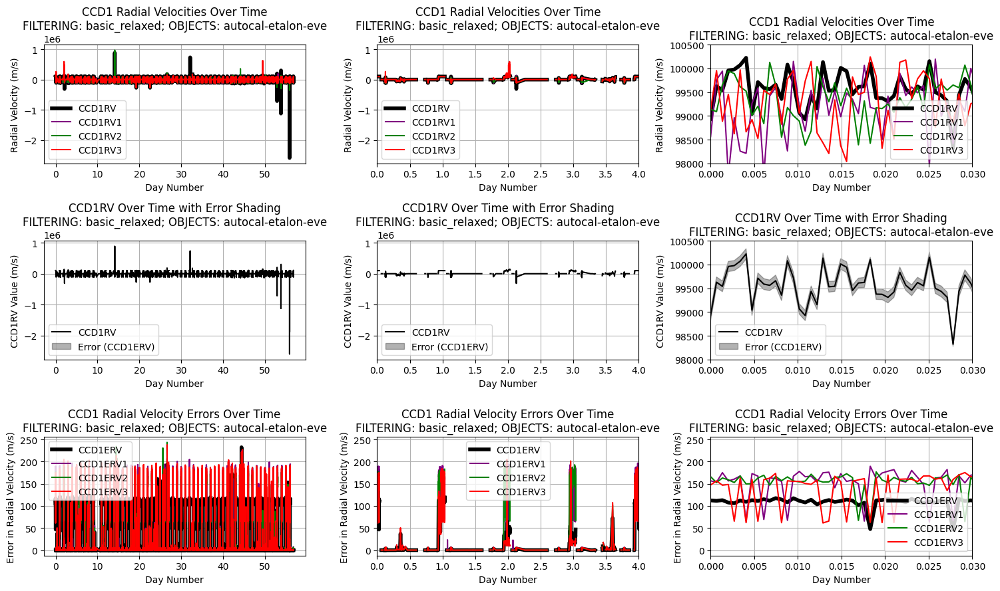

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,28553.703657,-0.400002,0.0,99343.324887,61429.940393,215.138257,-4.929346,195.101081
CCD1RV1,29191.693175,-0.974153,0.0,98949.094103,55043.660217,188.559327,0.077606,-0.830206
CCD1RV2,29043.538466,-0.122044,0.0,98910.154380,56191.164825,193.472172,0.221279,2.870887
CCD1RV3,29546.517337,0.922809,0.0,98647.973107,56479.381519,191.154108,0.425879,2.485014


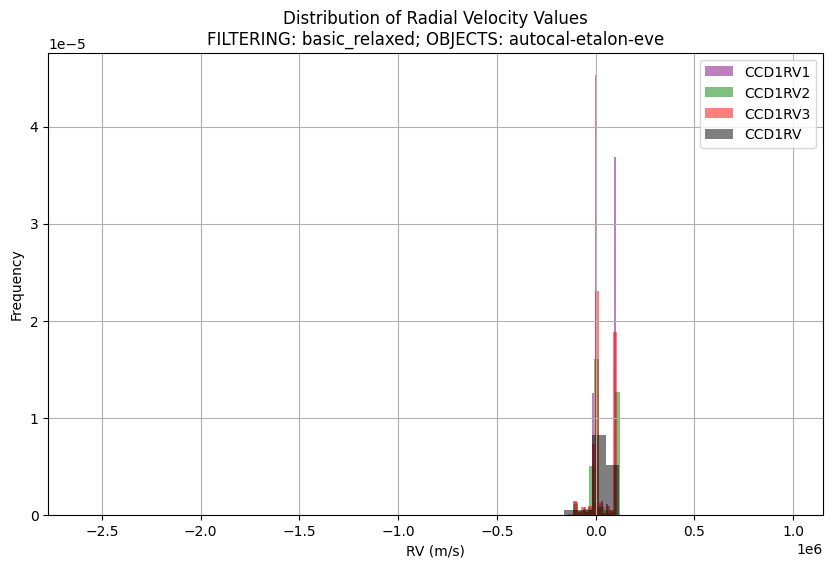

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,37.346482,0.473631,0.0,107.215121,51.390131,137.603671,0.728777,-1.392545
CCD1ERV1,55.808354,0.865124,0.0,158.670348,76.814688,137.640123,0.741904,-1.385237
CCD1ERV2,53.505892,0.763955,0.0,150.766744,73.313484,137.019459,0.711496,-1.447911
CCD1ERV3,49.151983,0.840856,0.0,146.496524,71.348333,145.158605,0.959706,-0.919135


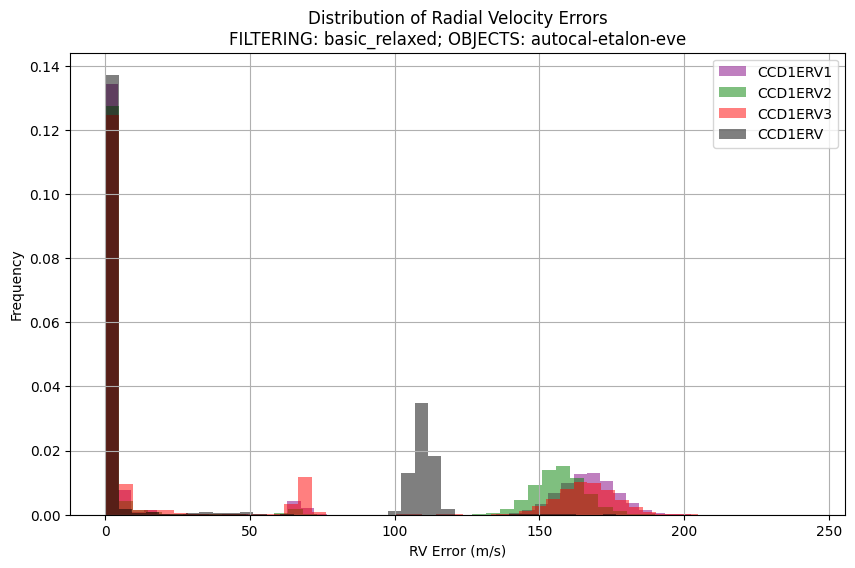

In [51]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1, xmin=0, xmax=.03, ymin=98000, ymax=100500, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the error in RV varies over time, with periodic spikes near the bginning of each day
#   how is the error itself computed?

# examine RV values
show_rv_value_stats(df_ccd1)
plot_rv_value_histograms(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   i'd naively expect a uniform distribution about y=x but we don't see this
#   howard mentioned that the error distribution around CCD1RV1=0 arises from the bias
plot_rv_value_comparisons(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1)
plot_rv_error_histograms(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the overall error is less than the error of each fiber (as expected)
#   the error distributions are different for the different fibers
plot_rv_error_vs_rv_value_overlay(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   there is some clustering in the error 
plot_rv_error_comparisons(df_ccd1, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

## EDA - CCD1 - Etalon

#### EDA - CCD1 - Etalon - all

In [29]:
# pass only objects that are etalon
df_ccd1_etalon= df_ccd1[df_ccd1['OBJECT'].str.contains('autocal-etalon')]

# inspect the df
display(df_ccd1_etalon.sample(3))

# display the df shape
print(f"DataFrame Shape: {df_ccd1_etalon.shape}")

# display the unique objects
print(df_ccd1_etalon['OBJECT'].unique())

,ObsID,OBJECT,datecode,CCD1BJD,day_num,NOTJUNK,GOODREAD,EMSAT,EMNEG,LOWBIAS,...,kpfred.COL_PRESS,kpfred.CRYOBODY_T,kpfred.CRYOBODY_TRG,kpfred.CURRTEMP,kpfred.ECH_PRESS,kpfred.KPF_CCD_T,kpfred.STA_CCD_T,kpfred.STA_CCD_TRG,CCD1RV_upper,CCD1RV_lower
20090,KP.20241004.63070.84,autocal-etalon-all-morn,20241004,2.460588e+06,33.730215,1.0,None,None,None,NaN,...,1.000000e-11,18.9988,19.0,-140.503,8.873210e-08,-100.811,-100.0010,-100.0,-5.203774,-5.387195
5057,KP.20240911.25391.97,autocal-etalon-all-night,20240911,2.460565e+06,10.287905,1.0,None,None,None,NaN,...,1.000000e-11,18.9996,19.0,-140.503,9.118640e-08,-100.811,-99.9982,-100.0,-9.157352,-9.349495
27254,KP.20241017.31352.09,autocal-etalon-all-night,20241017,2.460601e+06,46.363039,1.0,None,None,None,NaN,...,1.000000e-11,18.9995,19.0,-140.503,8.600000e-08,-100.813,-99.9998,-100.0,-5.227154,-5.422152


DataFrame Shape: (4897, 185)
['autocal-etalon-all-eve' 'autocal-etalon-all-night'
 'autocal-etalon-all-morn' 'autocal-etalon-all-midday']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



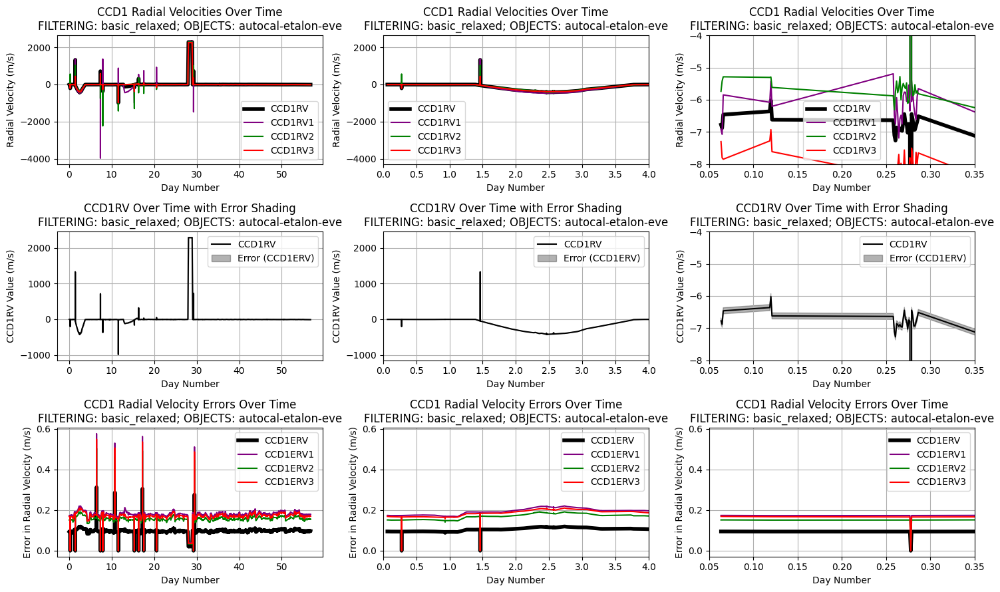

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,-16.001355,-6.968615,-988.303670,1.593935,147.676454,-922.899687,11.257168,181.500686
CCD1RV1,-27.656307,-6.853872,-3974.780862,2.233075,177.592222,-642.140041,4.421552,145.895199
CCD1RV2,-11.247298,-5.560099,-2231.696705,1.493932,150.565969,-1338.685743,9.636201,177.551802
CCD1RV3,-12.970361,-7.950369,-981.372142,1.646458,141.699814,-1092.489332,11.967239,198.216104


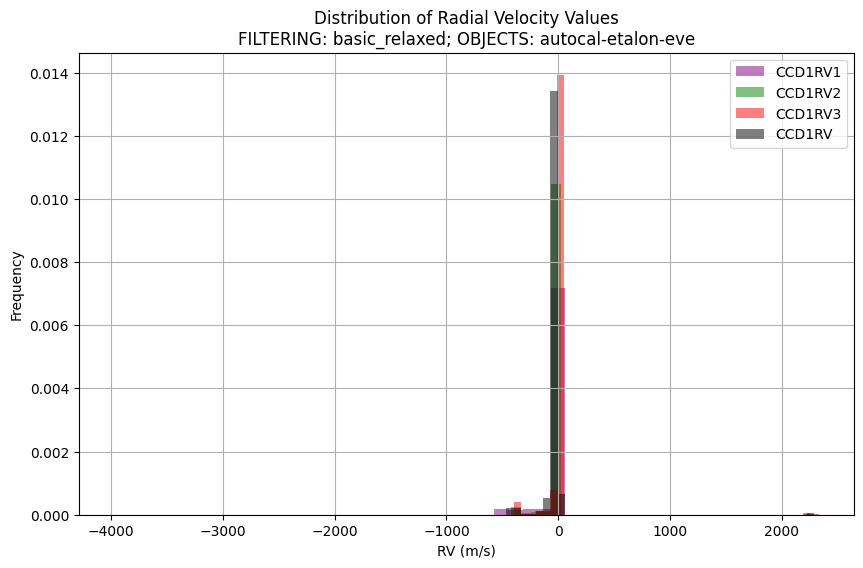

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.097585,0.097061,0.0,0.005997,0.010381,10.637617,2.763479,135.810014
CCD1ERV1,0.180447,0.179847,0.0,0.012020,0.019251,10.668403,2.666697,132.606123
CCD1ERV2,0.156864,0.156079,0.0,0.010342,0.016692,10.641274,2.822876,136.875411
CCD1ERV3,0.171375,0.170530,0.0,0.011394,0.018288,10.671065,2.752973,134.522553


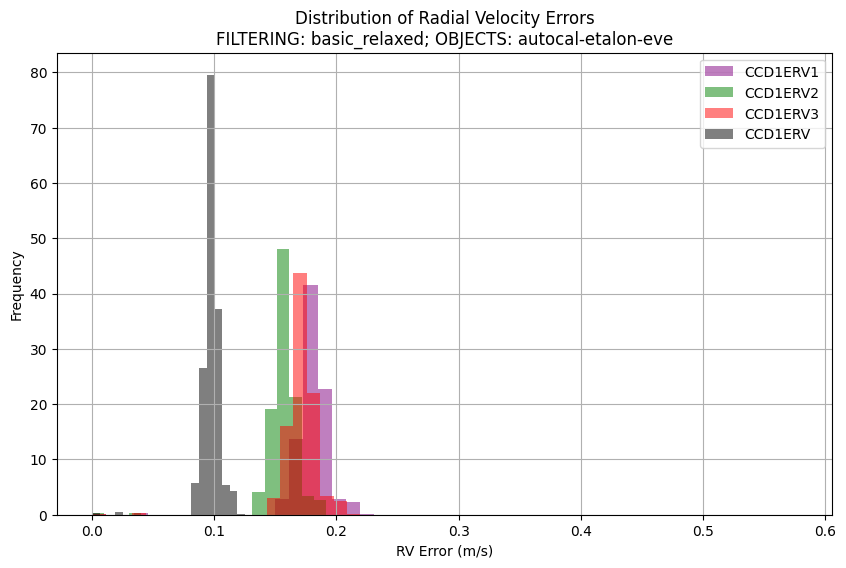

"compare_rv_clusters(df_ccd1_etalon, 'CCD1ERV', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_etalon, 'CCD1ERV1', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_etalon, 'CCD1ERV2', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_etalon, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"

In [30]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_etalon, xmin=0.05, xmax=.35, ymin=-8, ymax=-4, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the error in RV varies over time (not a surprise)
#   how is the error itself computed?

# examine RV values
show_rv_value_stats(df_ccd1_etalon)
plot_rv_value_histograms(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   why aren't the RV's centered about 0?
plot_rv_value_vs_rv_mean_overlay(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   i'd naively expect a uniform distribution about y=x but we don't see this
#   howard mentioned that the error distribution around CCD1RV1=0 arises from the bias
plot_rv_value_comparisons(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0

# examine RV errors
show_rv_error_stats(df_ccd1_etalon)
plot_rv_error_histograms(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the overall error is ~ 0.1m/s, which is desired
#   the shape of the error distribution is not gaussian
plot_rv_error_vs_rv_value_overlay(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   there is some clustering in the error 
plot_rv_error_comparisons(df_ccd1_etalon, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0;  for Fiber1/Fiber2 the slope =/= 1

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_etalon, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# investigate if there are any IQR outliers
"""show_iqr_outliers(df_ccd1_etalon, 'CCD1ERV')
show_iqr_outliers(df_ccd1_etalon, 'CCD1ERV1')
show_iqr_outliers(df_ccd1_etalon, 'CCD1ERV2')
show_iqr_outliers(df_ccd1_etalon, 'CCD1ERV3')"""
# perform t tests on errors from each error cluster
"""compare_rv_clusters_ttest(df_ccd1_etalon, 'CCD1ERV', 0.00025, 'CCD1ERV')
compare_rv_clusters_ttest(df_ccd1_etalon, 'CCD1ERV1', 0.00025, 'CCD1ERV1')
compare_rv_clusters_ttest(df_ccd1_etalon, 'CCD1ERV2', 0.00025, 'CCD1ERV2')
compare_rv_clusters_ttest(df_ccd1_etalon, 'CCD1ERV3', 0.00025, 'CCD1ERV3')"""
# perform t tests on temp from each error cluster
"""compare_rv_clusters(df_ccd1_etalon, 'CCD1ERV', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_etalon, 'CCD1ERV1', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_etalon, 'CCD1ERV2', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_etalon, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"""

#### EDA - CCD1 - Etalon - Eve

In [31]:
# pass only objects that are etalon - eve
df_ccd1_etalon_eve = df_ccd1_etalon[df_ccd1_etalon['OBJECT'] == 'autocal-etalon-all-eve']

# display the df shape
print(f"DataFrame Shape: {df_ccd1_etalon_eve.shape}")

# display the unique objects
print(df_ccd1_etalon_eve['OBJECT'].unique())

DataFrame Shape: (336, 185)
['autocal-etalon-all-eve']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



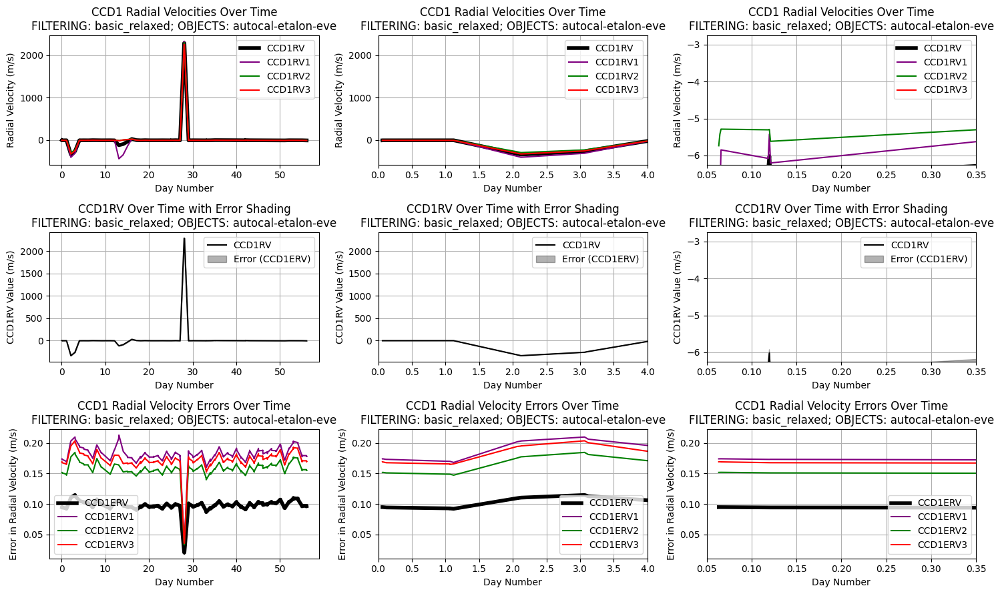

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,21.472728,-5.604070,-342.116537,1.874726,311.202405,1449.291456,6.875002,47.472244
CCD1RV1,8.355444,-5.506771,-442.441435,2.478376,327.302913,3917.241579,6.249324,42.281765
CCD1RV2,28.542252,-4.311237,-296.783178,2.211154,308.611105,1081.243009,6.994335,48.499935
CCD1RV3,24.845450,-6.440502,-329.290616,2.205219,305.198305,1228.387095,6.924059,47.918600


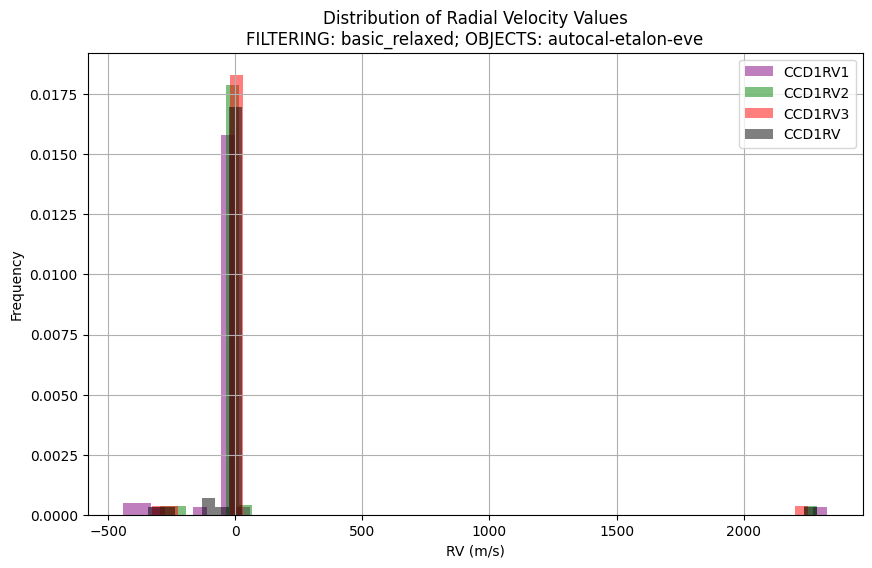

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.097528,0.098041,0.100888,0.006925,0.011651,11.946245,-5.048552,31.402197
CCD1ERV1,0.180341,0.181447,0.037721,0.012356,0.021743,12.056429,-4.910852,30.328278
CCD1ERV2,0.156689,0.157837,0.152791,0.011592,0.018668,11.914387,-5.042171,31.361776
CCD1ERV3,0.171379,0.172462,0.035644,0.011985,0.020507,11.965820,-5.049888,31.541025


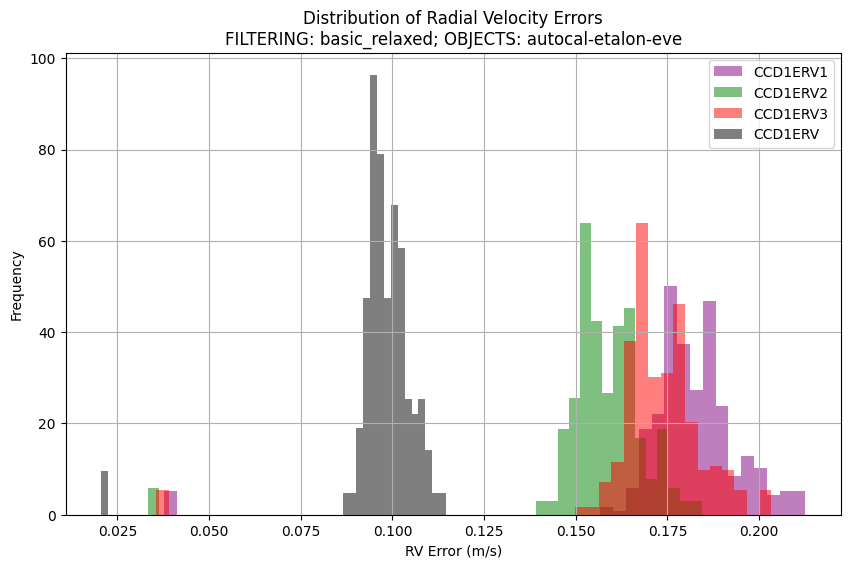

In [32]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_etalon_eve, xmin=0.05, xmax=.35, ymin=-6.25, ymax=-2.75, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_etalon_eve)
plot_rv_value_histograms(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_etalon_eve)
plot_rv_error_histograms(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_etalon_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_eve, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_eve, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_eve, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_eve, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

#### EDA - CCD1 - Etalon - Night

In [33]:
# pass only objects that are etalon - night
df_ccd1_etalon_night = df_ccd1_etalon[df_ccd1_etalon['OBJECT'].str.contains('autocal-etalon-all-night')]

# display the df shape
print(f"DataFrame Shape: {df_ccd1_etalon_night.shape}")

# display the unique objects
print(df_ccd1_etalon_night['OBJECT'].unique())

DataFrame Shape: (4054, 185)
['autocal-etalon-all-night']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



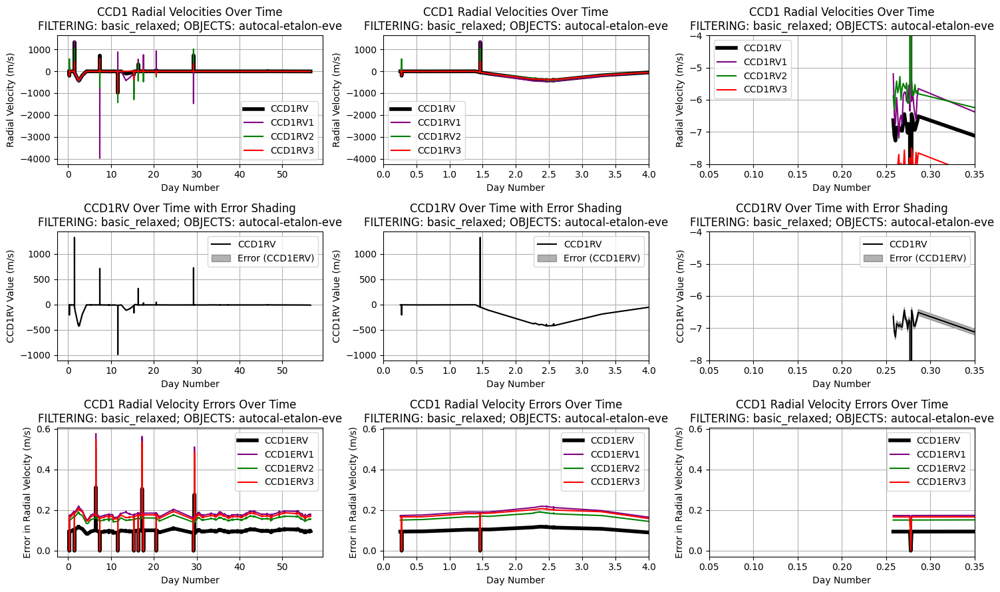

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,-23.696293,-7.125991,-988.303670,1.476749,77.026167,-325.055770,-2.309620,48.377801
CCD1RV1,-35.899230,-6.996508,-3974.780862,2.148467,123.840956,-344.968283,-9.536947,266.896336
CCD1RV2,-18.811549,-5.713399,-1428.303120,1.382002,77.871477,-413.955697,-4.590291,74.869910
CCD1RV3,-20.634735,-8.115866,-981.372142,1.461951,67.960812,-329.351515,-4.774873,31.576069


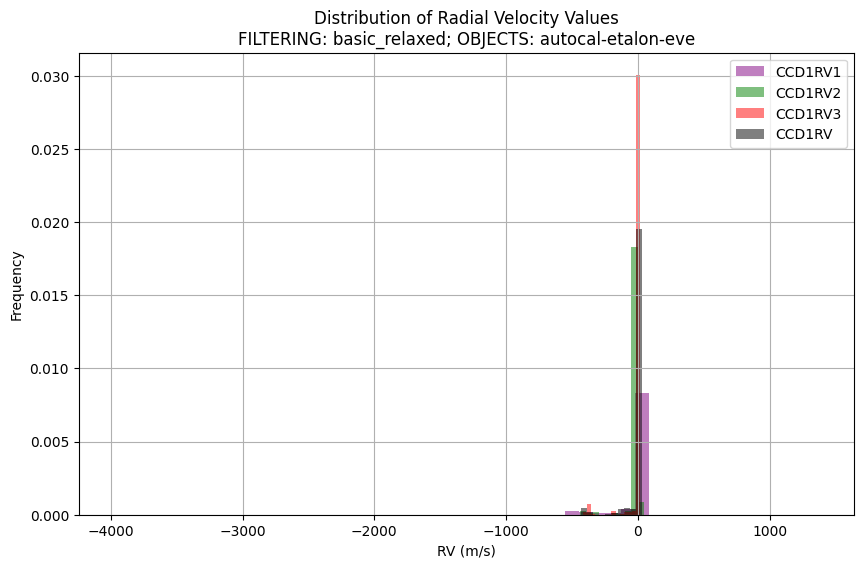

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.097629,0.096973,0.0,0.005651,0.009503,9.734245,4.559495,177.632457
CCD1ERV1,0.180542,0.179653,0.0,0.011414,0.017640,9.770641,4.419636,172.637119
CCD1ERV2,0.156940,0.155906,0.0,0.010206,0.015288,9.741460,4.624390,179.280625
CCD1ERV3,0.171431,0.170405,0.0,0.010876,0.016733,9.761070,4.534713,175.712043


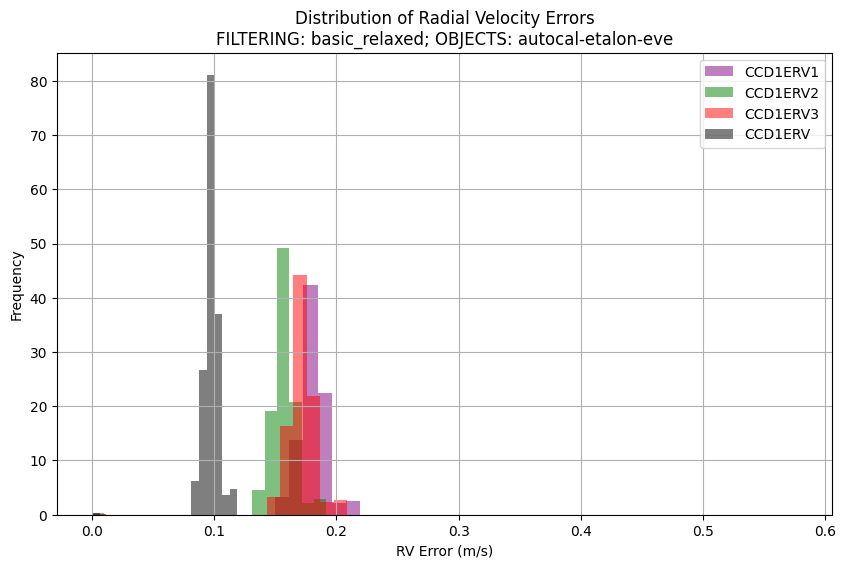

In [34]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_etalon_night, xmin=0.05, xmax=.35, ymin=-8, ymax=-4, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_etalon_night)
plot_rv_value_histograms(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_etalon_night)
plot_rv_error_histograms(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_etalon_night, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_night, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_night, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_night, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_night, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

#### EDA - CCD1 - Etalon - Morn

In [35]:
# pass only objects that are etalon - morn
df_ccd1_etalon_morn = df_ccd1_etalon[df_ccd1_etalon['OBJECT'].str.contains('autocal-etalon-all-morn')]

# display the df shape
print(f"DataFrame Shape: {df_ccd1_etalon_morn.shape}")

# display the unique objects
print(df_ccd1_etalon_morn['OBJECT'].unique())

DataFrame Shape: (492, 185)
['autocal-etalon-all-morn']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



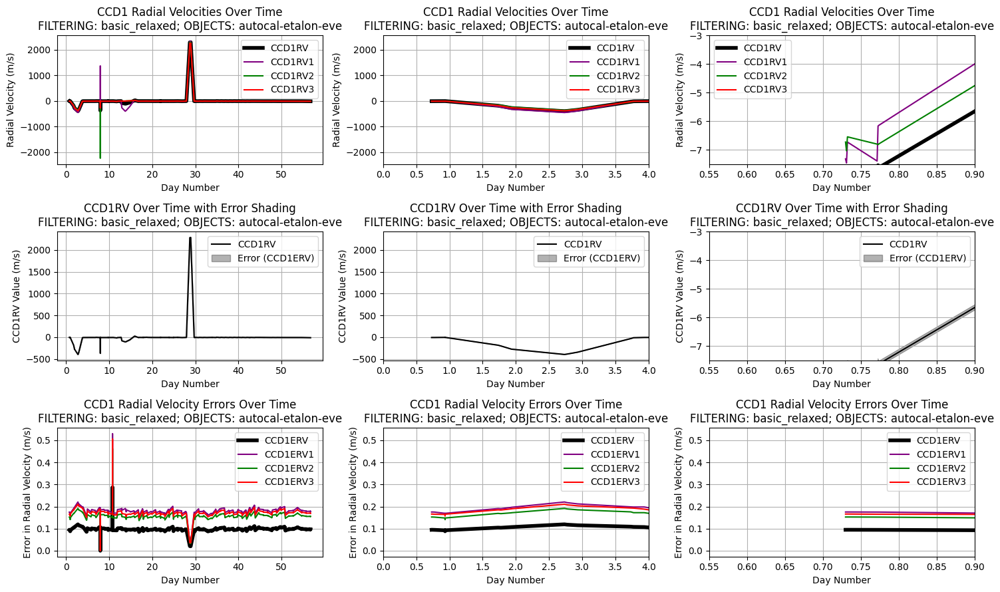

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,21.488873,-6.299004,-397.187710,1.991748,315.512682,1468.260720,6.738912,45.869452
CCD1RV1,14.989100,-6.233923,-450.944390,2.494669,333.941067,2227.892759,6.128872,39.865172
CCD1RV2,23.687986,-4.738049,-2231.696705,2.137446,328.995046,1388.868808,5.277370,42.603586
CCD1RV3,24.160255,-7.130843,-383.336123,2.225116,309.341937,1280.375284,6.786155,46.277032


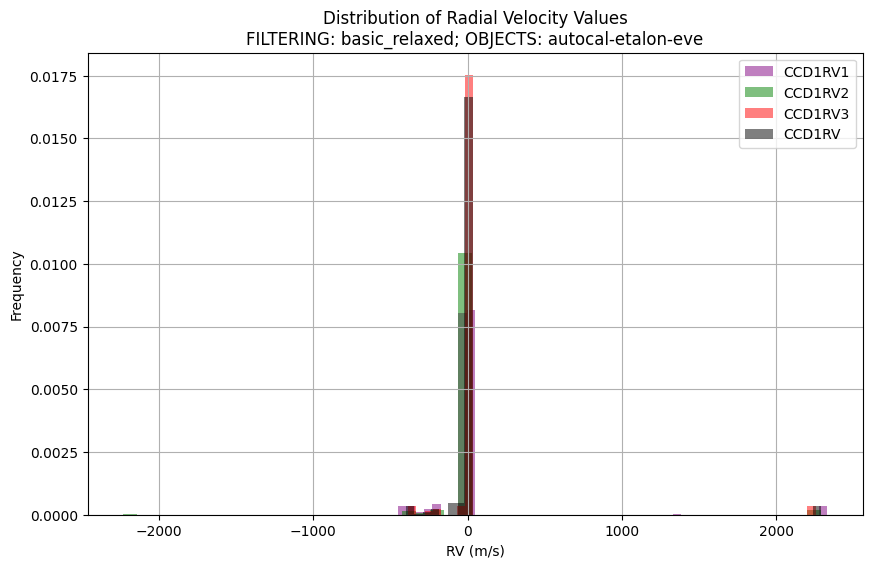

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.097204,0.097980,0.095488,0.007467,0.015343,15.784457,1.148274,59.887387
CCD1ERV1,0.179640,0.181496,0.220500,0.013942,0.028298,15.752405,1.110021,59.887091
CCD1ERV2,0.156260,0.157473,0.000000,0.012573,0.024671,15.788680,1.175583,59.823181
CCD1ERV3,0.170812,0.172255,0.000000,0.013492,0.027087,15.857529,1.158805,59.485678


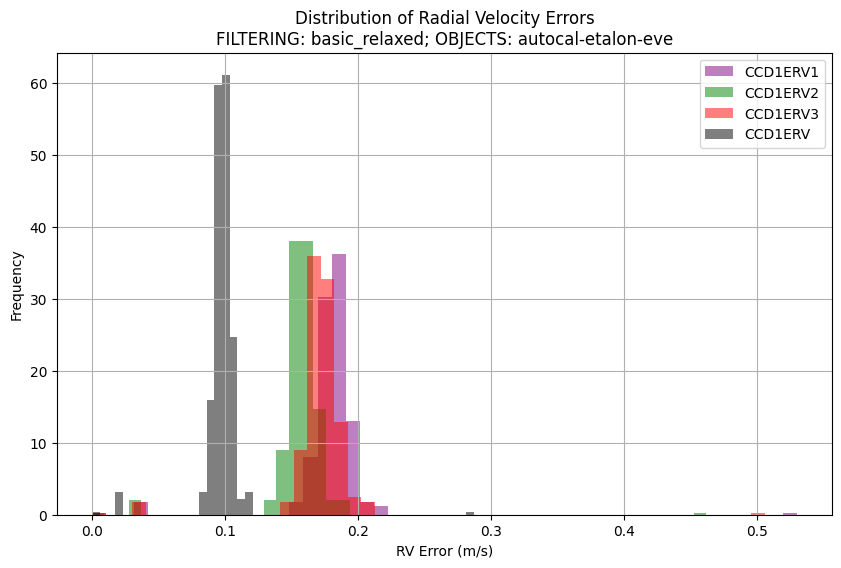

In [36]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_etalon_morn, xmin=0.55, xmax=.9, ymin=-7.5, ymax=-3, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_etalon_morn)
plot_rv_value_histograms(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_etalon_morn)
plot_rv_error_histograms(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_etalon_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_morn, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_morn, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_morn, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_morn, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

#### EDA - CCD1 - Etalon - Midday

In [37]:
# pass only objects that are etalon - midday
df_ccd1_etalon_midday = df_ccd1_etalon[df_ccd1_etalon['OBJECT'].str.contains('autocal-etalon-all-midday')]

# display the df shape
print(f"DataFrame Shape: {df_ccd1_etalon_midday.shape}")

# display the unique objects
print(df_ccd1_etalon_midday['OBJECT'].unique())

DataFrame Shape: (15, 185)
['autocal-etalon-all-midday']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



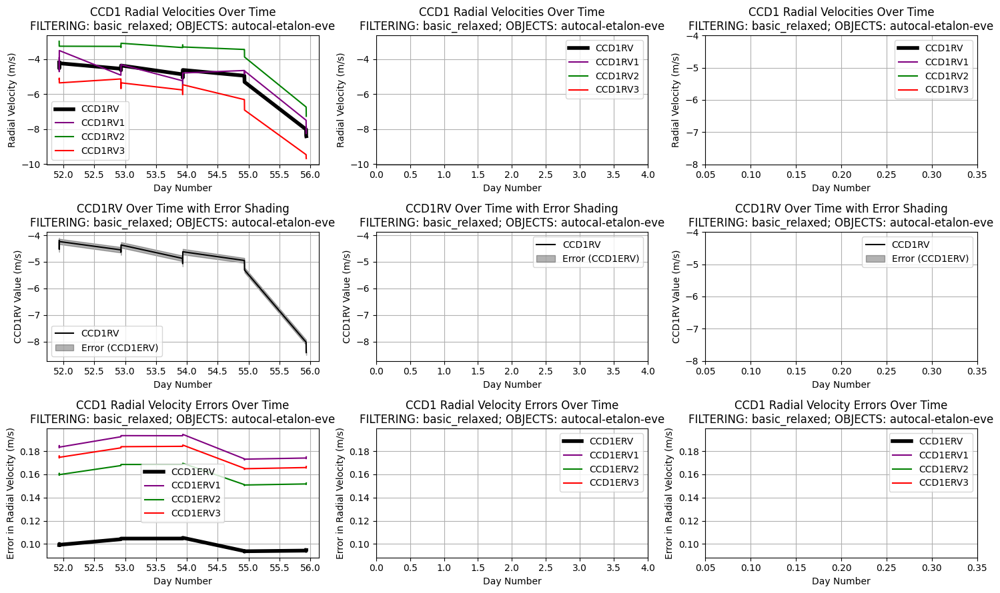

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,-5.415013,-4.871126,-8.406918,0.653928,1.512905,-27.939080,-1.353445,0.087196
CCD1RV1,-5.301724,-4.793213,-8.260159,0.883150,1.432347,-27.016620,-1.076282,-0.110106
CCD1RV2,-4.045593,-3.335036,-7.264055,0.402576,1.520691,-37.588832,-1.458150,0.246974
CCD1RV3,-6.504094,-5.761658,-9.680298,1.351183,1.688818,-25.965453,-1.174674,-0.225736


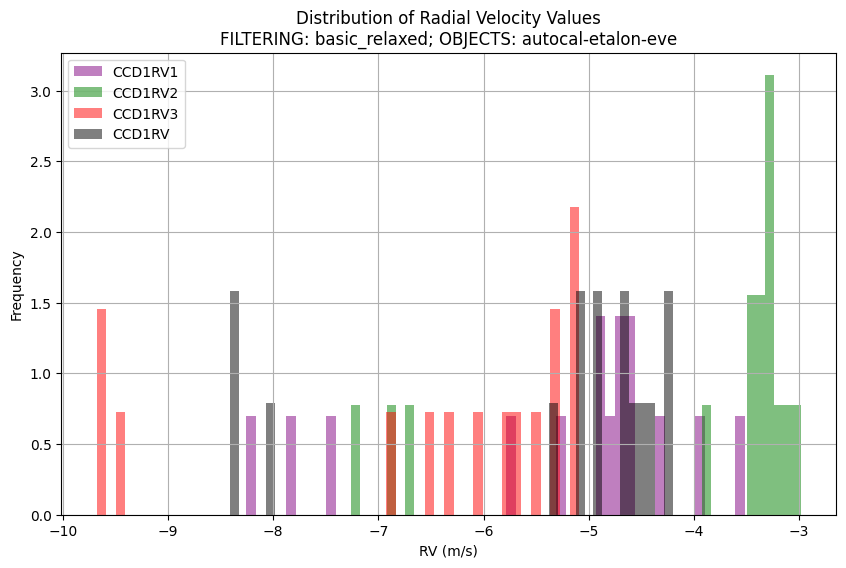

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.099426,0.099315,0.093427,0.010430,0.004979,5.008051,-0.012110,-1.723159
CCD1ERV1,0.183545,0.183413,0.172408,0.019404,0.009229,5.028050,-0.019819,-1.726655
CCD1ERV2,0.159964,0.159735,0.150304,0.016865,0.008044,5.028470,-0.006959,-1.723865
CCD1ERV3,0.174779,0.174647,0.164261,0.018081,0.008698,4.976522,-0.015750,-1.718147


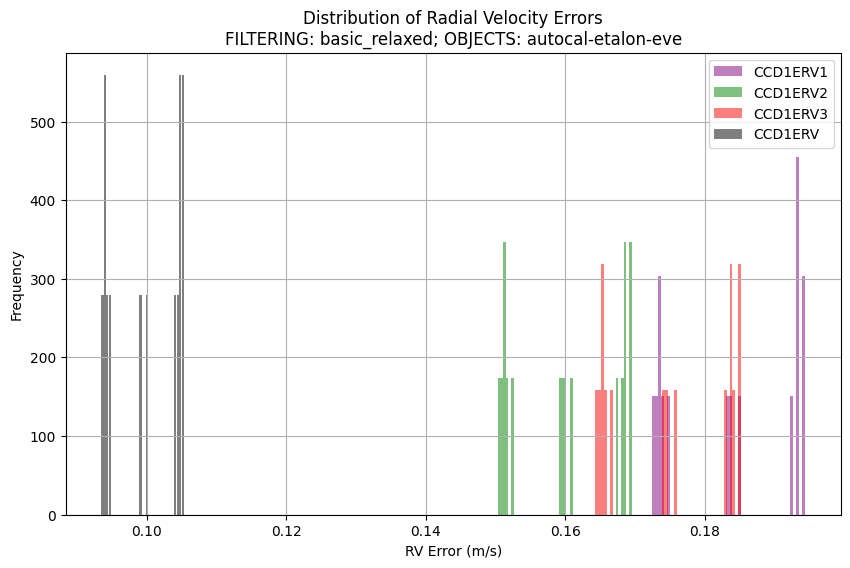

In [38]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_etalon_midday, xmin=0.05, xmax=.35, ymin=-8, ymax=-4, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_etalon_midday)
plot_rv_value_histograms(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_etalon_midday)
plot_rv_error_histograms(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_etalon_midday, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_midday, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_midday, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_midday, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_etalon_midday, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

## EDA - CCD1 - LFC

#### EDA - CCD1 - LFC - all

In [39]:
# pass only objects that are lfc
df_ccd1_lfc = df_ccd1[df_ccd1['OBJECT'].str.contains('autocal-lfc')]

# inspect the df
display(df_ccd1_lfc.sample(3))

# display the df shape
print(f"DataFrame Shape: {df_ccd1_lfc.shape}")

# display the unique objects
print(df_ccd1_lfc['OBJECT'].unique())

,ObsID,OBJECT,datecode,CCD1BJD,day_num,NOTJUNK,GOODREAD,EMSAT,EMNEG,LOWBIAS,...,kpfred.COL_PRESS,kpfred.CRYOBODY_T,kpfred.CRYOBODY_TRG,kpfred.CURRTEMP,kpfred.ECH_PRESS,kpfred.KPF_CCD_T,kpfred.STA_CCD_T,kpfred.STA_CCD_TRG,CCD1RV_upper,CCD1RV_lower
31121,KP.20241024.12996.45,autocal-lfc-all-eve,20241024,2.460608e+06,53.149924,1.0,None,None,None,NaN,...,1.000000e-11,19.0010,19.0,-140.500,8.500000e-08,-100.815,-100.0020,-100.0,136.895153,136.879626
31300,KP.20241024.67875.03,autocal-lfc-all-morn,20241024,2.460608e+06,53.785060,1.0,None,None,None,NaN,...,1.000000e-11,19.0007,19.0,-140.502,8.342860e-08,-100.816,-99.9987,-100.0,136.857421,136.841310
316,KP.20240901.67443.11,autocal-lfc-all-morn,20240901,2.460555e+06,0.780619,1.0,None,None,None,NaN,...,1.000000e-11,19.0012,19.0,-140.498,9.440000e-08,-100.809,-99.9995,-100.0,136.651093,136.615032


DataFrame Shape: (818, 185)
['autocal-lfc-all-eve' 'autocal-lfc-all-morn' 'autocal-lfc-all-midnight']


In [40]:
"""
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_lfc, xmin=0.1, xmax=.35, ymin=134, ymax=139, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the error in RV varies over time (not a surprise)
#   how is the error itself computed?

# examine RV values
show_rv_value_stats(df_ccd1_lfc)
plot_rv_value_histograms(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   i'd naively expect a uniform distribution about y=x but we don't see this
#   howard mentioned that the error distribution around CCD1RV1=0 arises from the bias
plot_rv_value_comparisons(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0

# examine RV errors
show_rv_error_stats(df_ccd1_lfc)
plot_rv_error_histograms(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   why aren't the RV errors centered around 0 (some neg, some pos)?
plot_rv_error_vs_rv_value_overlay(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   there is some clustering in the error 
plot_rv_error_comparisons(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0;  for Fiber1/Fiber2 the slope =/= 1

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
"""

# investigate if there are any IQR outliers
"""show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV1')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV2')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV3')"""
# perform t tests on errors from each error cluster
"""compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'CCD1ERV')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'CCD1ERV1')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'CCD1ERV2')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'CCD1ERV3')"""
# perform t tests on temp from each error cluster
"""compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"""

"compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"

In [41]:
"""
# apply filter to keep data only in linear region with 
df_ccd1_lfc = df_ccd1_lfc[
    (df_ccd1_lfc['SNRSC452'] >= -22) &
    (df_ccd1_lfc['SNRSC548'] <= 1250) &
    (df_ccd1_lfc['SNRSC652'] <= 1250) &
    (df_ccd1_lfc['SNRSC747'] <= 1100) &
    (df_ccd1_lfc['SNRSC852'] <= 1025)
]
"""

"\n# apply filter to keep data only in linear region with \ndf_ccd1_lfc = df_ccd1_lfc[\n    (df_ccd1_lfc['SNRSC452'] >= -22) &\n    (df_ccd1_lfc['SNRSC548'] <= 1250) &\n    (df_ccd1_lfc['SNRSC652'] <= 1250) &\n    (df_ccd1_lfc['SNRSC747'] <= 1100) &\n    (df_ccd1_lfc['SNRSC852'] <= 1025)\n]\n"

/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



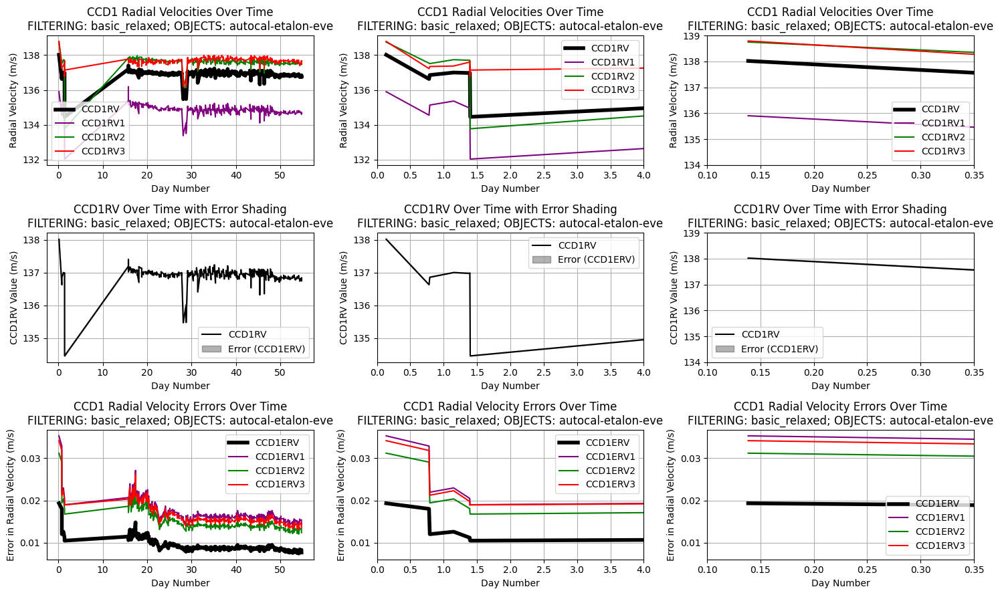

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,136.923011,136.964447,134.459493,0.153129,0.272775,0.199218,-4.549787,25.854270
CCD1RV1,134.876651,134.906357,132.039043,0.262048,0.313946,0.232766,-3.039313,17.910910
CCD1RV2,137.597938,137.638180,133.778944,0.164975,0.306402,0.222679,-5.879835,49.793909
CCD1RV3,137.671453,137.698518,136.204956,0.188572,0.257694,0.187180,-3.636693,18.369203


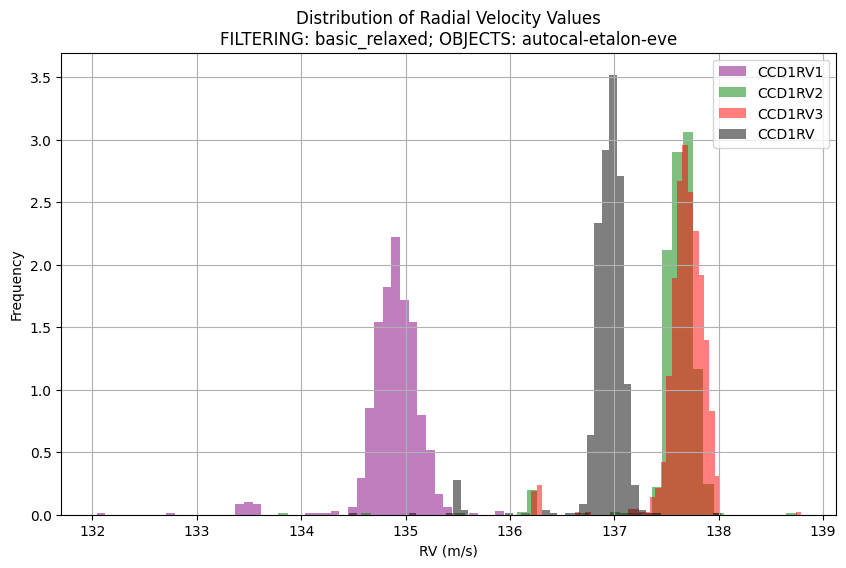

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.009229,0.008883,0.008923,0.000768,0.001160,12.565158,2.490493,11.778424
CCD1ERV1,0.016986,0.016461,0.015436,0.001303,0.002044,12.034612,2.557952,12.988640
CCD1ERV2,0.014814,0.014222,0.012870,0.001262,0.001900,12.827585,2.458188,11.222649
CCD1ERV3,0.016223,0.015582,0.014659,0.001373,0.002078,12.810453,2.452988,11.224441


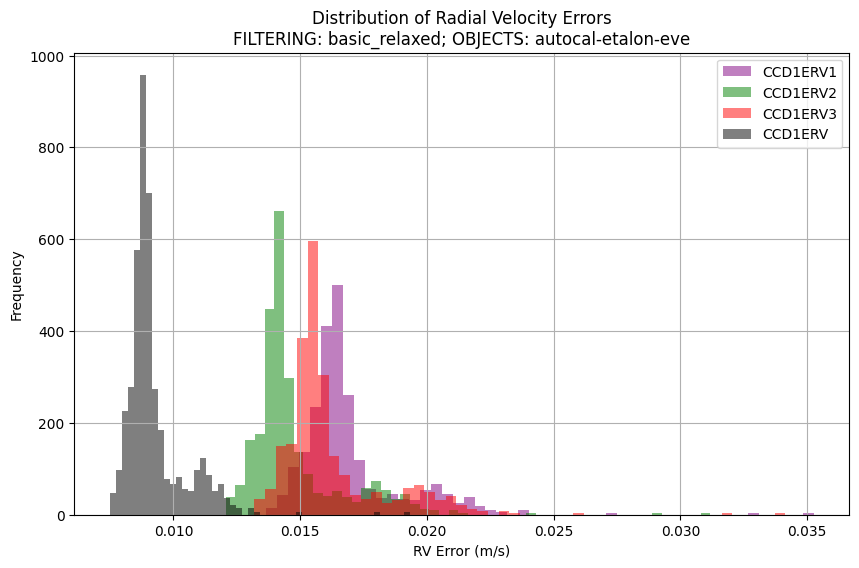

"compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'ETAV1C1T')\ncompare_rv_clusters(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"

In [42]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_lfc, xmin=0.1, xmax=.35, ymin=134, ymax=139, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   the error in RV varies over time (not a surprise)
#   how is the error itself computed?

# examine RV values
show_rv_value_stats(df_ccd1_lfc)
plot_rv_value_histograms(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   i'd naively expect a uniform distribution about y=x but we don't see this
#   howard mentioned that the error distribution around CCD1RV1=0 arises from the bias
plot_rv_value_comparisons(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0

# examine RV errors
show_rv_error_stats(df_ccd1_lfc)
plot_rv_error_histograms(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
#   why aren't the RV errors centered around 0 (some neg, some pos)?
plot_rv_error_vs_rv_value_overlay(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   there is some clustering in the error 
plot_rv_error_comparisons(df_ccd1_lfc, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
#   y-offset =/= 0;  for Fiber1/Fiber2 the slope =/= 1

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# investigate if there are any IQR outliers
"""show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV1')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV2')
show_iqr_outliers(df_ccd1_lfc, 'CCD1ERV3')"""
# perform t tests on errors from each error cluster
"""compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'CCD1ERV')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'CCD1ERV1')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'CCD1ERV2')
compare_rv_clusters_ttest(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'CCD1ERV3')"""
# perform t tests on temp from each error cluster
"""compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV1', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV2', 0.00025, 'ETAV1C1T')
compare_rv_clusters(df_ccd1_lfc, 'CCD1ERV3', 0.00025, 'ETAV1C1T')"""

In [43]:
# Comparison of RV values between two Fibers...left-most plot
inspect_obs_details(df_ccd1_lfc, ['KP.20240929.12077.88',
'KP.20240929.12620.11',
'KP.20240929.12077.88',
'KP.20240929.12945.35',
'KP.20240929.68420.39',
'KP.20240929.68311.77',
'KP.20240929.68094.88', # outliers to the left (all above)
'KP.20240902.34389.23', # this is one of the ~3 outliers to the bottom-left
'KP.20241025.12672.04', # examples of most data (all below)
'KP.20241005.68200.44',
'KP.20241012.12237.40',
'KP.20241012.12779.51',
'KP.20241014.68471.54',
'KP.20240919.13000.45',
'KP.20241017.68145.00'])

,NOTJUNK,GOODREAD,EMSAT,EMNEG,LOWBIAS,LOWDARK,LFC2DFOK,OLDBIAS,OLDDARK,OLDFLAT,FFFB,EXPMETER,GREEN
713,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
9412,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
16618,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
16623,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
16626,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
17369,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
17371,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
17372,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
20701,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES
24374,1.0,None,None,None,NaN,NaN,1.0,1.0,1.0,1.0,No,NO,YES


#### EDA - CCD1 - LFC - eve

In [44]:
# pass only objects that are lfc - even
df_ccd1_lfc_eve = df_ccd1_lfc[df_ccd1_lfc['OBJECT'] == 'autocal-lfc-all-eve']

# display the df shape
print(f"DataFrame Shape: {df_ccd1_lfc_eve.shape}")

# display the unique objects
print(df_ccd1_lfc_eve['OBJECT'].unique())

DataFrame Shape: (354, 185)
['autocal-lfc-all-eve']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



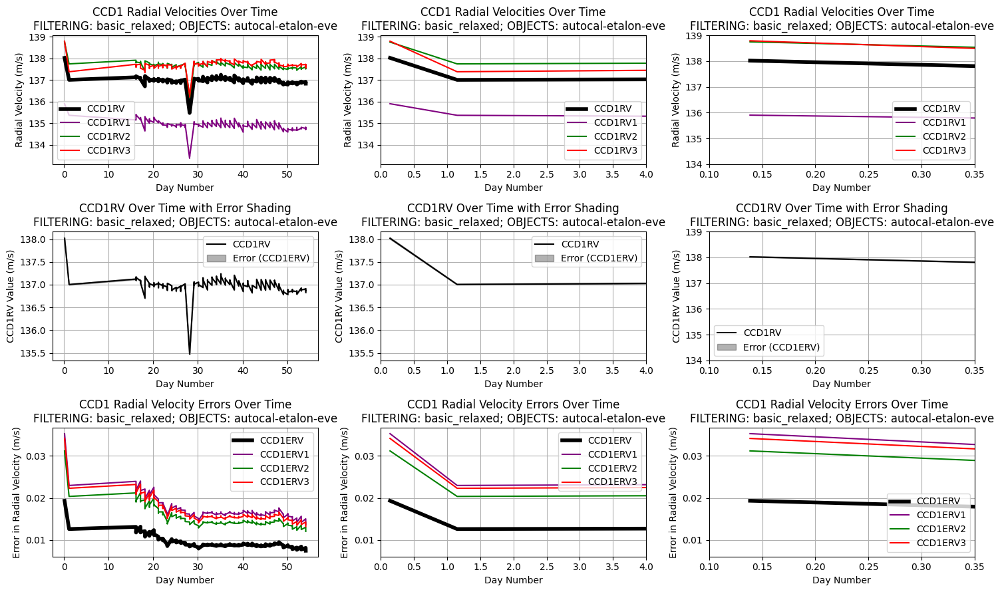

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,136.954261,136.987337,135.473837,0.155231,0.261480,0.190925,-4.232914,22.993802
CCD1RV1,134.920567,134.947041,133.383386,0.245737,0.292664,0.216915,-3.077681,14.557651
CCD1RV2,137.629190,137.663228,136.183462,0.160420,0.257969,0.187438,-3.961579,21.604002
CCD1RV3,137.690174,137.706654,136.210357,0.181774,0.265937,0.193141,-3.704683,19.414097


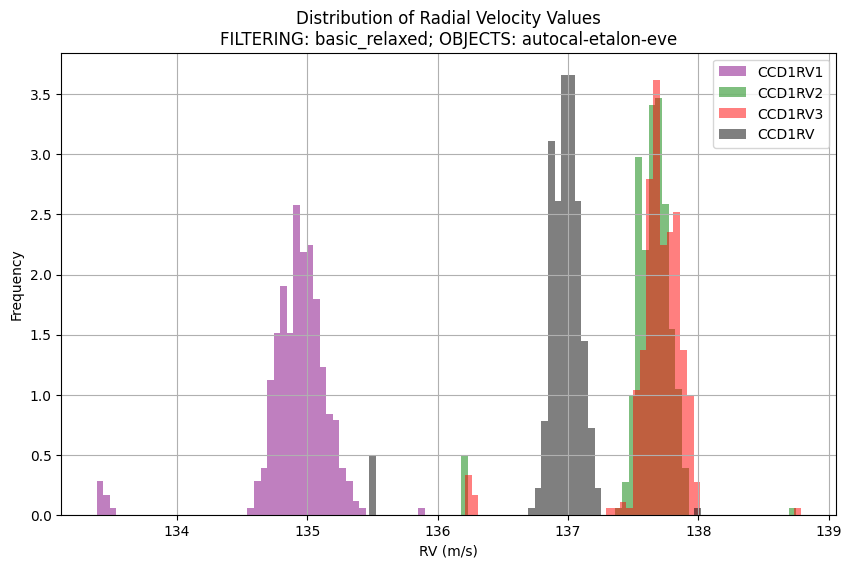

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.009295,0.008924,0.008923,0.000734,0.001205,12.961835,2.642947,13.674273
CCD1ERV1,0.017107,0.016539,0.013665,0.001218,0.002129,12.446088,2.710494,14.965295
CCD1ERV2,0.014921,0.014281,0.014128,0.001211,0.001973,13.221729,2.606850,13.047656
CCD1ERV3,0.016341,0.015651,0.015369,0.001342,0.002156,13.194330,2.608373,13.113153


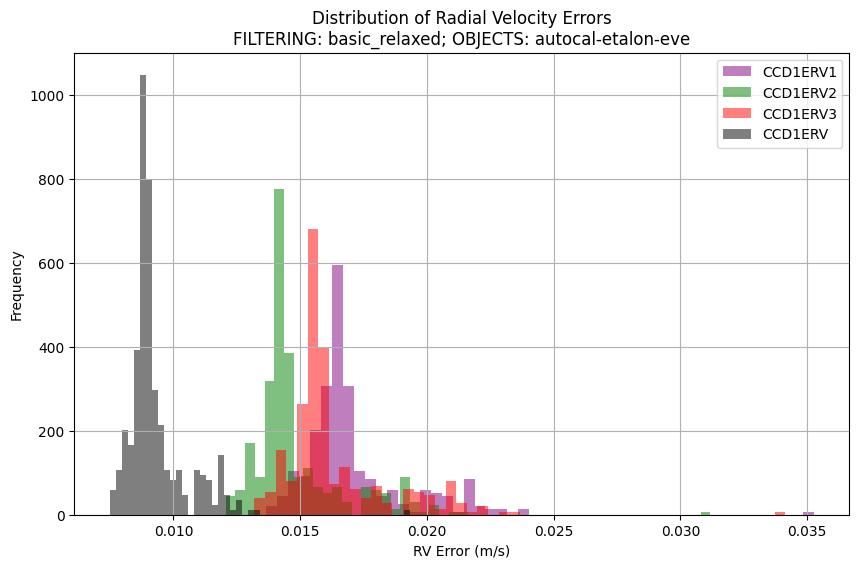

In [45]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_lfc_eve, xmin=0.1, xmax=.35, ymin=134, ymax=139, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_lfc_eve)
plot_rv_value_histograms(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_lfc_eve)
plot_rv_error_histograms(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_lfc_eve, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_eve, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_eve, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_eve, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_eve, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

#### EDA - CCD1 - LFC - midnight

In [46]:
# pass only objects that are lfc - midnight
df_ccd1_lfc_midnight = df_ccd1_lfc[df_ccd1_lfc['OBJECT'] == 'autocal-lfc-all-midnight']

# display the df shape
print(f"DataFrame Shape: {df_ccd1_lfc_midnight.shape}")

# display the unique objects
print(df_ccd1_lfc_midnight['OBJECT'].unique())

DataFrame Shape: (108, 185)
['autocal-lfc-all-midnight']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



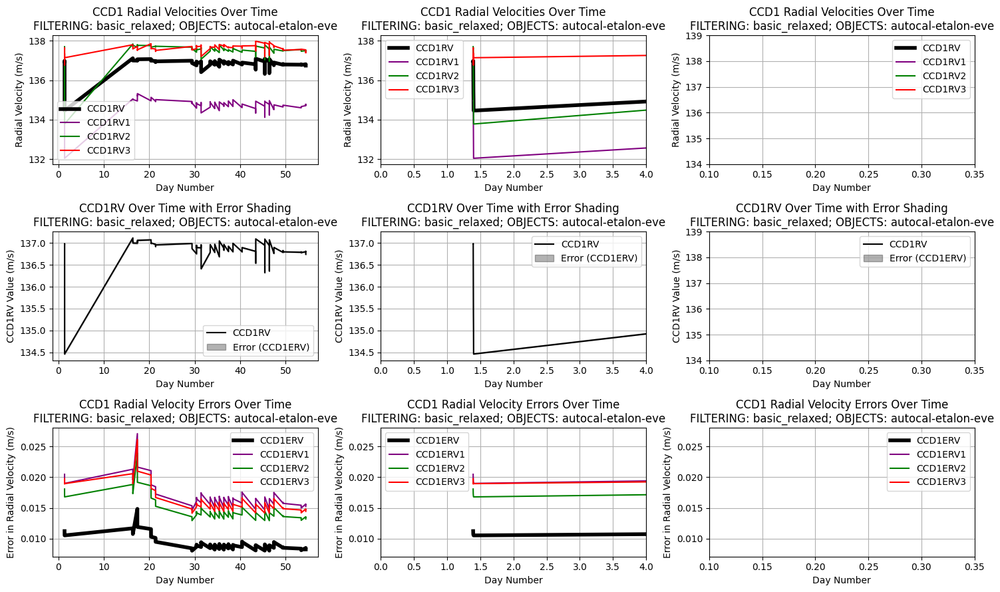

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,136.840133,136.906288,134.459493,0.170917,0.350048,0.255808,-4.838873,26.160704
CCD1RV1,134.748605,134.789272,132.039043,0.242997,0.403457,0.299414,-4.249171,23.148071
CCD1RV2,137.495375,137.570167,133.778944,0.192054,0.519378,0.377742,-5.495451,32.312325
CCD1RV3,137.650166,137.666468,136.766937,0.171143,0.174925,0.127079,-1.603749,5.727396


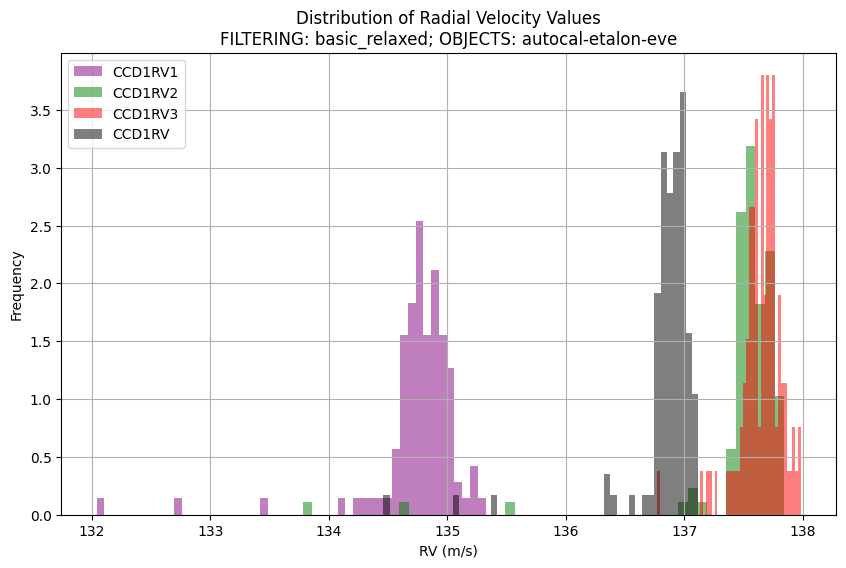

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.009289,0.008978,0.008938,0.000872,0.001160,12.488771,1.962958,4.838359
CCD1ERV1,0.017116,0.016654,0.015436,0.001672,0.002052,11.986549,1.946330,5.182444
CCD1ERV2,0.014899,0.014347,0.013395,0.001380,0.001892,12.700748,1.992481,4.814747
CCD1ERV3,0.016327,0.015729,0.014659,0.001523,0.002086,12.775978,1.938681,4.507036


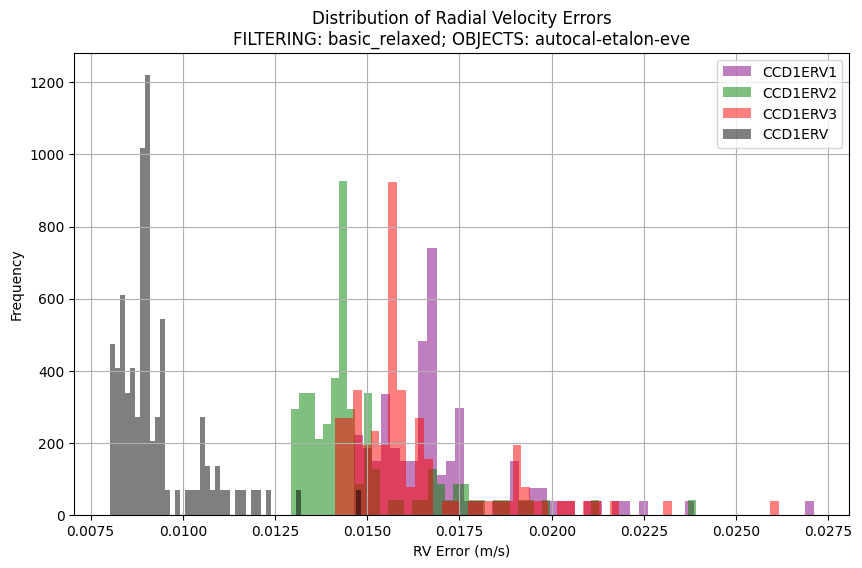

In [47]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_lfc_midnight, xmin=0.1, xmax=.35, ymin=134, ymax=139, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_lfc_midnight)
plot_rv_value_histograms(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_lfc_midnight)
plot_rv_error_histograms(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_lfc_midnight, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_midnight, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_midnight, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_midnight, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_midnight, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

#### EDA - CCD1 - LFC - morn

In [48]:
# pass only objects that are lfc - morn
df_ccd1_lfc_morn = df_ccd1_lfc[df_ccd1_lfc['OBJECT'] == 'autocal-lfc-all-morn']

# display the df shape
print(f"DataFrame Shape: {df_ccd1_lfc_morn.shape}")

# display the unique objects
print(df_ccd1_lfc_morn['OBJECT'].unique())

DataFrame Shape: (356, 185)
['autocal-lfc-all-morn']


/tmp/ipykernel_33/1733266532.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_33/1733266532.py:47: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



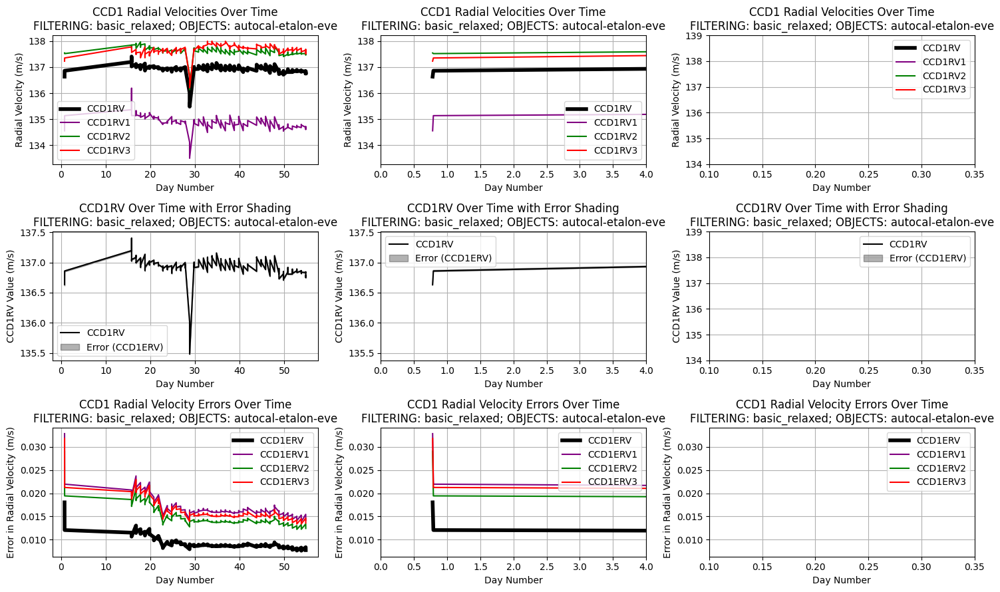

Radial Velocity Value (RV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1RV,136.917080,136.954683,135.482769,0.152917,0.251437,0.183642,-4.466594,22.359942
CCD1RV1,134.871827,134.888765,133.503168,0.272981,0.292687,0.217011,-1.859600,10.131062
CCD1RV2,137.597977,137.630742,136.132532,0.159882,0.253786,0.184441,-4.373805,21.741268
CCD1RV3,137.659295,137.696909,136.204956,0.197155,0.269529,0.195794,-3.686840,16.804445


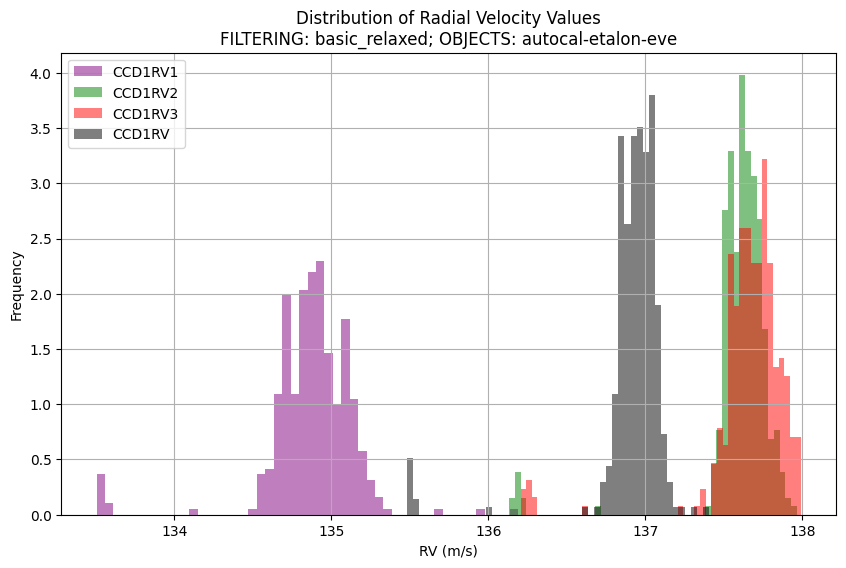

Radial Velocity Error (ERV) Statistics:


,Mean (m/s),Median (m/s),Mode (m/s),IQR (m/s),StDev (m/s),CoV (%),Skewness,Kurtosis
CCD1ERV,0.009144,0.008788,0.008412,0.000686,0.001110,12.142633,2.467895,11.475053
CCD1ERV1,0.016826,0.016245,0.016163,0.001179,0.001948,11.577572,2.563389,12.886180
CCD1ERV2,0.014682,0.014059,0.013868,0.001134,0.001825,12.429351,2.418413,10.796798
CCD1ERV3,0.016075,0.015412,0.013350,0.001220,0.001992,12.391077,2.424932,10.904268


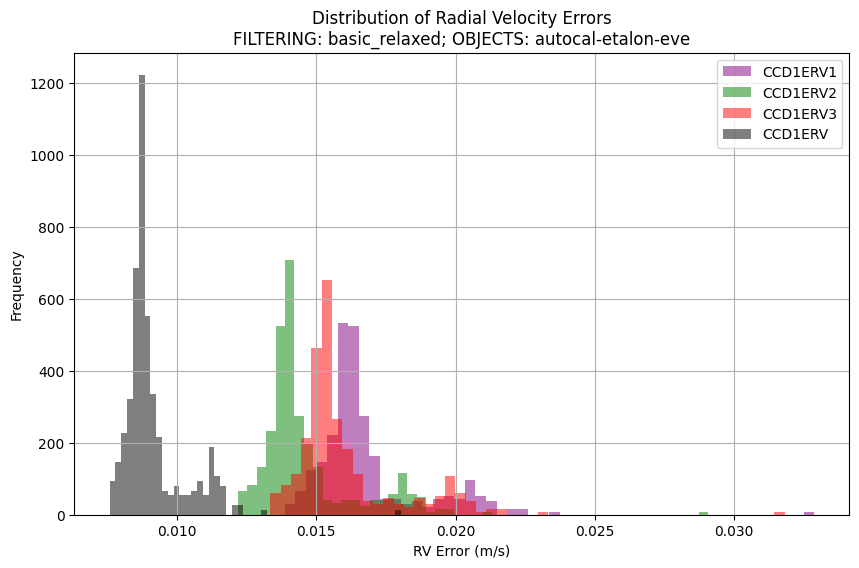

In [49]:
# plot RV values and errors over 3 different time scales
plot_time_trends(df_ccd1_lfc_morn, xmin=0.1, xmax=.35, ymin=134, ymax=139, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# examine RV values
show_rv_value_stats(df_ccd1_lfc_morn)
plot_rv_value_histograms(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_value_vs_rv_mean_overlay(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_value_comparisons(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# examine RV errors
show_rv_error_stats(df_ccd1_lfc_morn)
plot_rv_error_histograms(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_rv_value_overlay(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])
plot_rv_error_comparisons(df_ccd1_lfc_morn, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve', hover_details=['ObsID', 'OBJECT', 'day_num'])

# inspect the SNR of the Science Fiber at 5 wavelengths
rv_error_cols = ['CCD1ERV', 'CCD1ERV1', 'CCD1ERV2', 'CCD1ERV3']
colors = ['black', 'purple', 'green', 'red']
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_morn, 'SNRSC548', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_morn, 'SNRSC652', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_morn, 'SNRSC747', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')
plot_rv_error_vs_snr_overlay(df_ccd1_lfc_morn, 'SNRSC852', rv_error_cols, colors, subtitle='FILTERING: basic_relaxed; OBJECTS: autocal-etalon-eve')

# Provisional

## Correlation Mapping

In [50]:
print('temp1')

temp1


## Folded plots (period specification)

In [47]:
# define a function to ovrlay all cycles, over a given period, for a specified feature
def plot_time_folds(df, col_name, period=1):  # Default period set to 1 day
    # remove rows with NaN or infinite values in 'day_num' or 'col_name'
    df_clean = df.dropna(subset=['day_num', col_name])
    df_clean = df_clean[np.isfinite(df_clean['day_num']) & np.isfinite(df_clean[col_name])]
    
    # make a scatter plot of feature over time
    plt.figure(figsize=(12, 4))
    plt.scatter(df_clean['day_num'], df_clean[col_name], alpha=0.6)
    plt.title(f"Scatter Plot of {col_name} vs Day Number")
    plt.xlabel('Day Number')
    plt.ylabel(col_name)
    plt.grid(True)
    plt.show()
    
    # make a phase folded scatter plot of the feature over a given period
    # compute the phase using the specified period
    phase = (df_clean['day_num'] % period) / period
    cycles = (df_clean['day_num'] // period).astype(int)  # determine which cycle each point belongs to
    plt.figure(figsize=(12, 4))
    # make a scatter plot with each cycle in a different color
    scatter = plt.scatter(phase * period, df_clean[col_name], c=cycles, cmap='plasma', alpha=0.6)
    plt.colorbar(scatter, label='Cycle Number')
    plt.title(f"Phase-Folded Plot for Period: {period} days")
    plt.xlabel(f'Time within Period ({period} days)')
    plt.ylabel(col_name)
    plt.grid(True)
    plt.show()


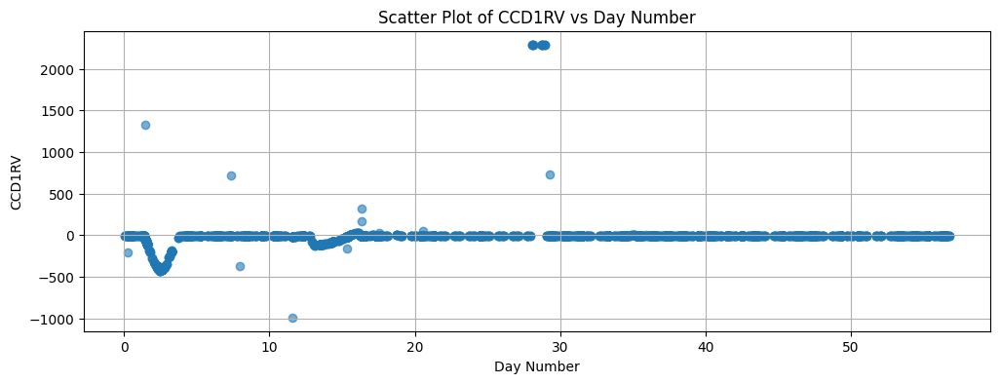

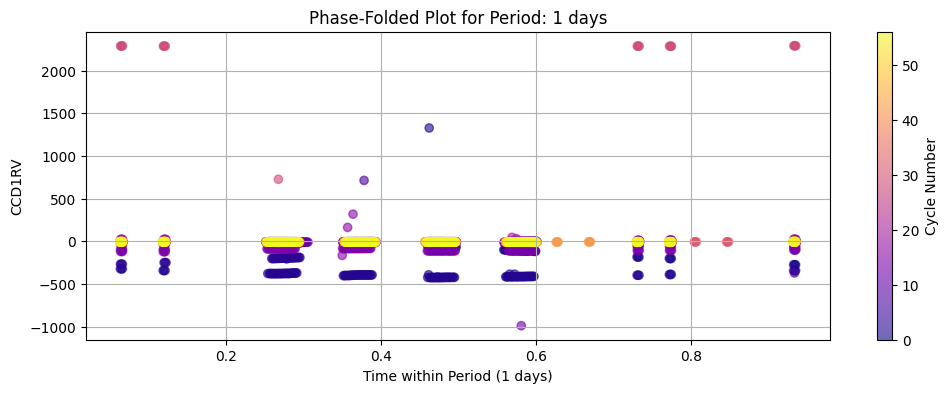

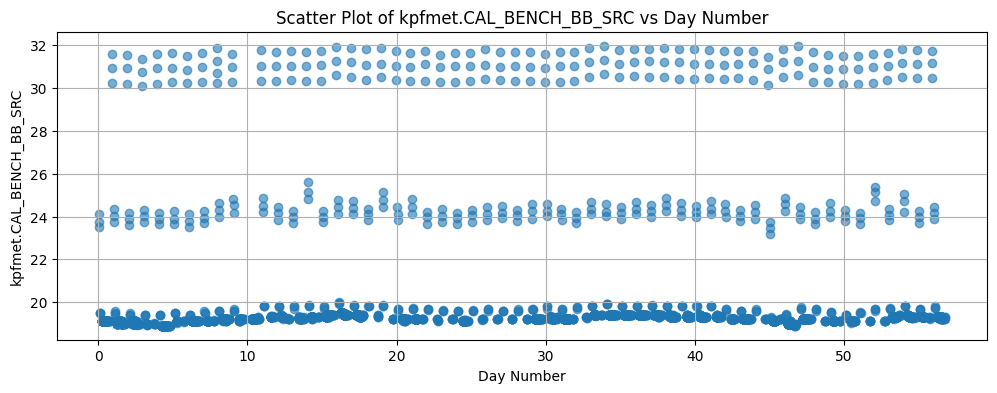

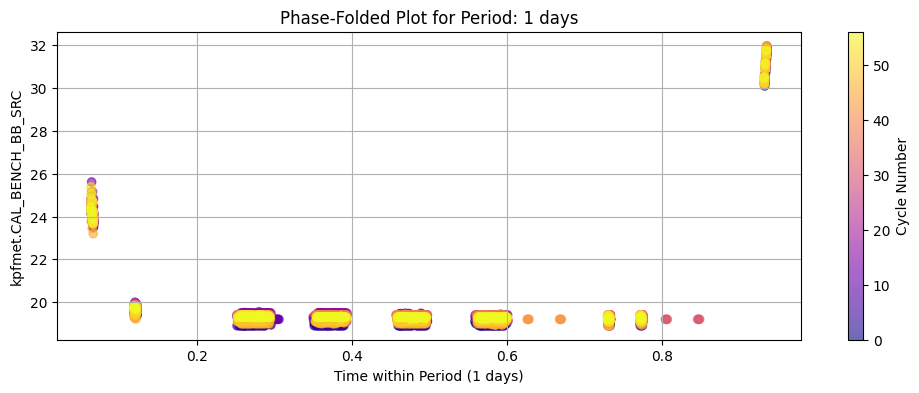

In [48]:
plot_time_folds(df_ccd1_etalon, 'CCD1RV') # kpfmet.CAL_BENCH_BB_SRC  Cal bench blackbody source temp
plot_time_folds(df_ccd1_etalon, 'kpfmet.CAL_BENCH_BB_SRC') # kpfmet.CAL_BENCH_BB_SRC  Cal bench blackbody source temp

## Folded plots (period decomposition)

In [49]:
from scipy.signal import periodogram

# define a function to ovrlay all cycles, over the highest-power periods, for a specified feature
def plot_time_decomposition(df, col_name):

    # data cleaning: need to drop rows where 'day_num' or 'col_name' is NaN or infinite
    df = df.dropna(subset=['day_num', col_name])
    df = df[np.isfinite(df['day_num']) & np.isfinite(df[col_name])]

    # make a scatter plot of feature over time
    plt.figure(figsize=(12, 4))
    plt.scatter(df['day_num'], df[col_name], alpha=0.6)
    plt.title(f"Scatter Plot of {col_name} vs Day Number")
    plt.xlabel('Day Number')
    plt.ylabel(col_name)
    plt.grid(True)
    plt.show()

    # apply fourier analysis, generate a periodogram, and annotate top-3 peaks
    fs = 1 / (df['day_num'].diff().median())  # compute sampling frequency in cycles/day
    frequencies, powers = periodogram(df[col_name], fs=fs)
    plt.figure(figsize=(12, 4))
    plt.semilogy(frequencies, powers)
    plt.title('Fourier Transform')
    plt.xlabel('Frequency (cycles/day)')
    plt.ylabel('Power')
    plt.xlim(0,100)
    # highlight the top 3 peaks
    top_freqs = frequencies[np.argsort(powers)[-3:]]
    for freq in top_freqs:
        plt.annotate(f'{freq:.4f}', xy=(freq, max(powers)), arrowprops=dict(arrowstyle='->'))
    plt.grid(True)
    plt.show()

    # make the pase-folded plots for top-3 frequencies
    for freq in top_freqs:
        period = 1 / freq
        phase = (df['day_num'] % period) / period
        cycles = (df['day_num'] // period).astype(int)  # determine which cycle each point belongs to
        plt.figure(figsize=(12, 4))
        scatter = plt.scatter(phase * period, df[col_name], c=cycles, cmap='viridis', alpha=0.6)  # using colormap 'viridis'
        plt.colorbar(scatter, label='Cycle Number')
        plt.title(f'Phase Folded Plot at Period: {period:.4f} days')
        plt.xlabel('Phase [days]')
        plt.ylabel(col_name)
        plt.grid(True)
        plt.show()

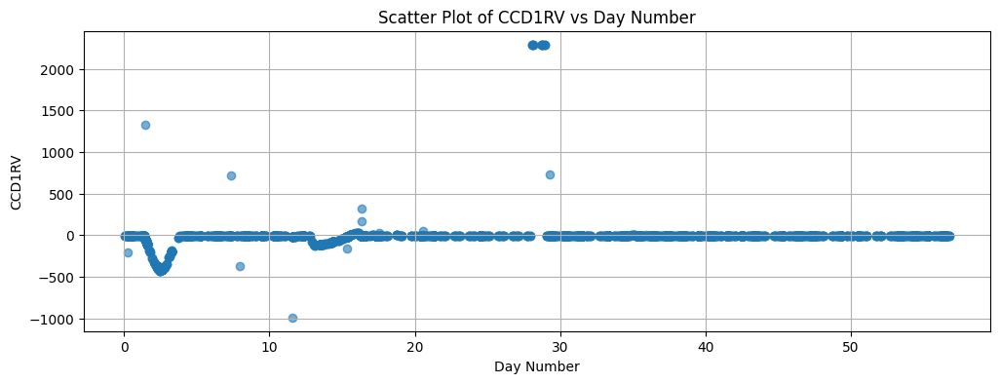

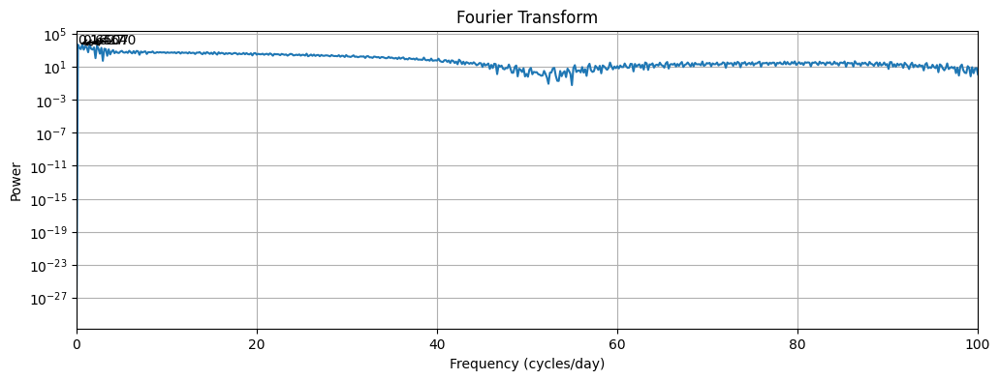

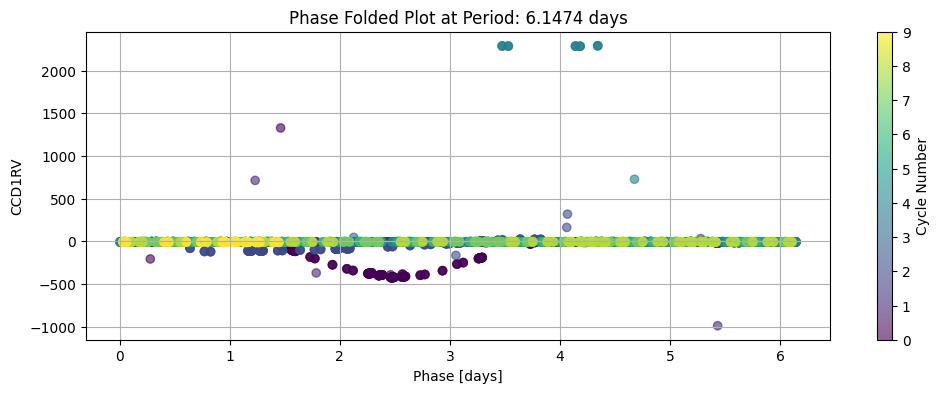

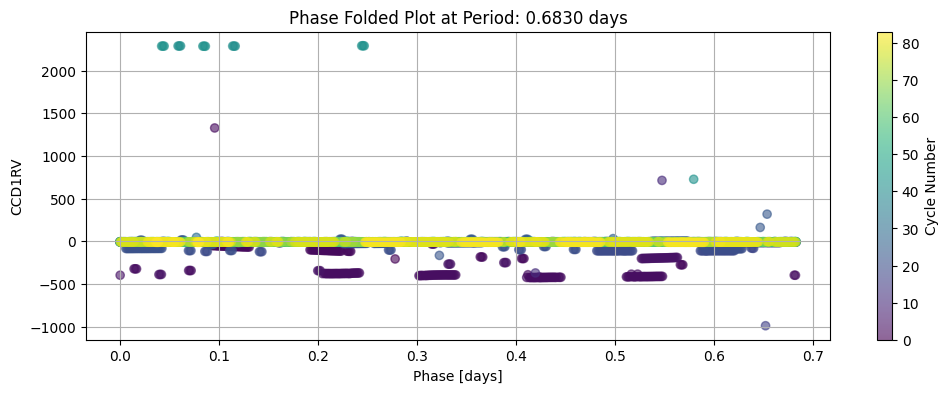

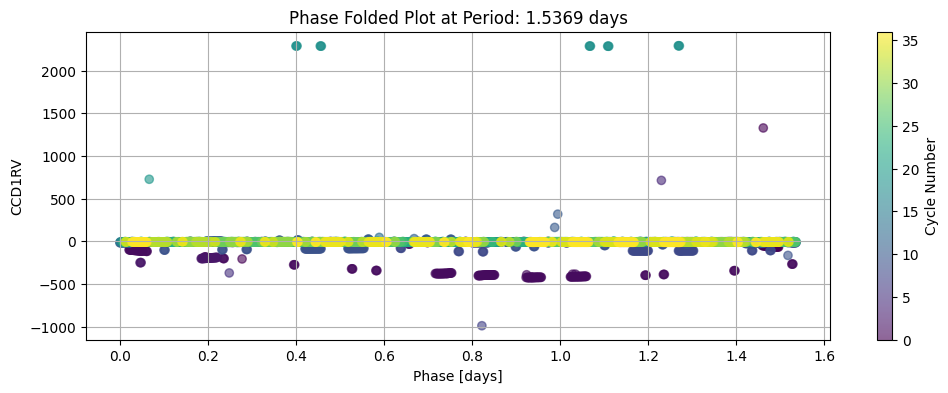

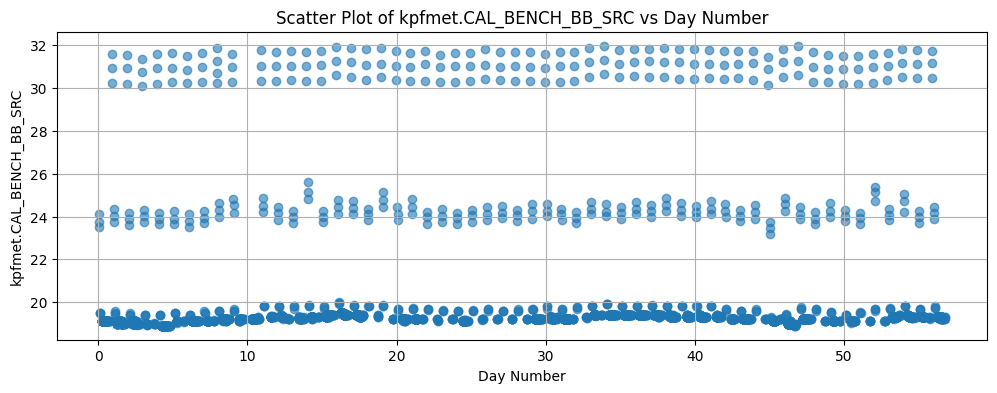

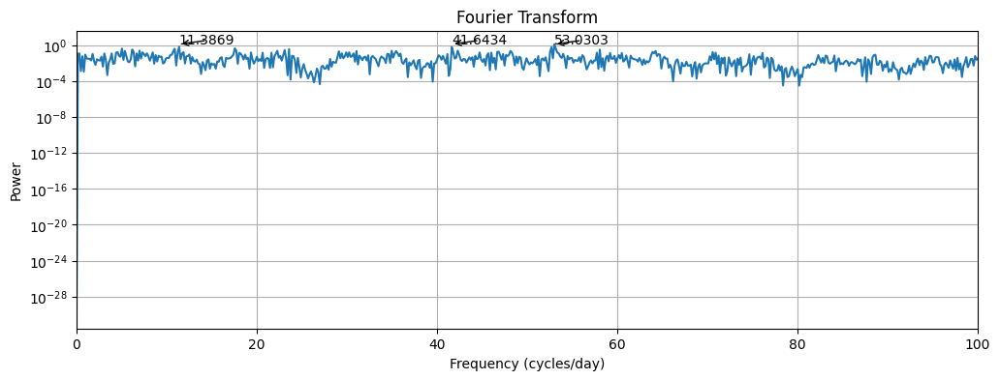

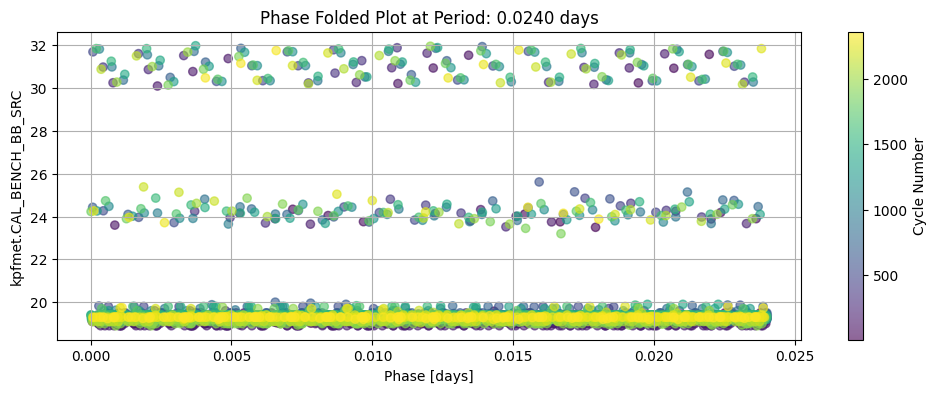

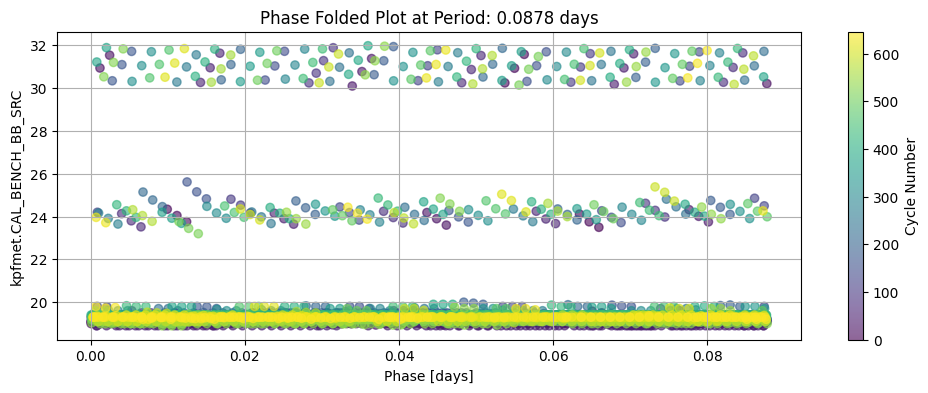

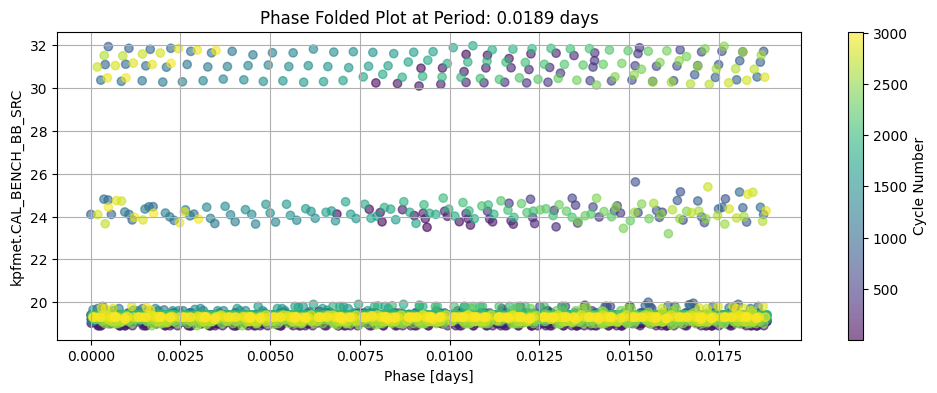

In [50]:
plot_time_decomposition(df_ccd1_etalon, 'CCD1RV') # kpfmet.CAL_BENCH_BB_SRC  Cal bench blackbody source temp
plot_time_decomposition(df_ccd1_etalon, 'kpfmet.CAL_BENCH_BB_SRC') # kpfmet.CAL_BENCH_BB_SRC  Cal bench blackbody source temp

## RV values vs. RV Errors, by time of day

In [ ]:
# make a scatter plot of RV values and RV errors for each object in CCD1 using Plotly
def plot_rv_error_scatter_by_object(df, xsubtitle='unspecified details', hover_details=['ObsID', 'OBJECT', 'day_num']):
    fig = go.Figure()

    # Ffilter the df's for different objects
    df_eve = df[df['OBJECT'] == 'autocal-lfc-all-eve']
    df_midnight = df[df['OBJECT'] == 'autocal-lfc-all-midnight']
    df_morn = df[df['OBJECT'] == 'autocal-lfc-all-morn']

    # Data configuration for each object
    object_config = [
        (df_eve, 'blue', 'Evening'),
        (df_midnight, 'orange', 'Midnight'),
        (df_morn, 'green', 'Morning')
    ]

    # make a plot for each object with hover data
    for object_df, color, name in object_config:
        rv_col = 'CCD1RV1'
        rv_err_col = 'CCD1ERV1'
        fig.add_trace(go.Scatter(
            x=object_df[rv_col],
            y=object_df[rv_err_col],
            mode='markers',
            marker=dict(color=color),
            name=name,
            text=object_df[hover_details].astype(str).agg(', '.join, axis=1),
            hoverinfo='text+x+y'
        ))

    # update the layout to set the axis limits and labels
    fig.update_layout(
        title='Correlation Between CCD1 Fiber 1 Radial Velocity Values and Errors, by Time of Day' + subtitle,
        xaxis=dict(title='RV (km/s)'),
        yaxis=dict(title='Error in RV (m/s)'),
        legend_title="Measurement times",
        hovermode='closest'
    )

    fig.show()

In [ ]:
plot_rv_error_scatter_by_object(df_ccd1_lfc, subtitle=': LFC')

In [53]:
# show the 5 lowest values for CCD1RV1 in the night
display(df_ccd1_lfc_midnight.sort_values(by='CCD1RV1', ascending=False).tail(5)[['ObsID', 'CCD1RV1']])

# show the 5 highest values for CCD1RV1 in the eve
display(df_ccd1_lfc_eve.sort_values(by='CCD1RV1', ascending=False).head(5)[['ObsID', 'CCD1RV1']])

,ObsID,CCD1RV1
27279,KP.20241017.34064.59,134.228970
26747,KP.20241016.34172.78,134.115105
711,KP.20240902.34172.46,133.449646
712,KP.20240902.34280.92,132.748567
713,KP.20240902.34389.23,132.039043


,ObsID,CCD1RV1
127,KP.20240901.11965.99,135.901516
8272,KP.20240917.12887.47,135.399649
8273,KP.20240917.12995.88,135.382434
648,KP.20240902.12974.73,135.366735
8267,KP.20240917.12344.67,135.328654


## Ongoing Development